# Enhancing VAE Performance with SimCLR: Self-Supervised Learning for Improved Image Inpainting

1. **Dane wejściowe**

    W zadaniu wykorzystany zostanie zbiór [Nature](https://www.kaggle.com/datasets/heyitsfahd/nature). Posiada on 100 956 obrazów o rozmiarach 64x64 i kolorze RGB, które należą do 4 klas: Miasto, Góry, Ogień i Jezior. Oprócz tego zostaną wygenerowane dodatkowe *uszkodzone* obrazy, czyli *oryginalne* zdjęcia z nałożonym w losowym miejscu czarnym kwadratem symbolizującym ubytek.

    Wejście do modelu będzie stanowić: X - zdjęcie *uszkodzone*, a uczony on będzie przy pomocy: Y - zdjęcie *oryginalne*.

2. **Dane wyjściowe**

    Na wyjściu autokodera zostanie wygenerowane zdjęcie uzupełnione, które będzie dążyć do maksymalnej zgodności z *oryginalnym* obrazem Y.

3. **Cel**

    Celem jest `inpainting` - zadanie rekonstrukcji obrazu, w którym brakujące fragmenty lub uszkodzone obszary zdjęć są uzupełniane w sposób zgodny z otaczającym kontekstem, tak aby uzyskać wizualnie spójny i realistyczny obraz.

4. **Hipoteza badawcza**

    Zastosowanie metody `Simple Framework for Contrastive Learning of Visual Representations (SimCLR)` do treningu enkodera modelu `Variational Autoencoder (VAE)` doprowadzi do poprawy jego wydajności w zadaniu inpaintingu obrazów.

5. **Opis metod**

    `Simple Framework for Contrastive Learning of Visual Representations (SimCLR)` - [A Simple Framework for Contrastive Learning of Visual Representations](https://arxiv.org/abs/2002.05709) - to metoda samo-nadzorowanego uczenia maszynowego używana do trenowania modeli bez potrzeby etykietowania danych. Proces ten opiera się na generowaniu dwóch losowo zmodyfikowanych wersji tych samych danych wejściowych poprzez augmentacje, taką jak przesunięcie, obrót, zmiana skali czy nałożenie filtrów. Następnie, te zmodyfikowane wersje danych są przetwarzane przez dwa enkodery: enkoder online i enkoder target, które generują reprezentacje cech dla każdej z wersji danych.


    `Variational Autoencoder (VAE)` - [Auto-Encoding Variational Bayes](https://arxiv.org/pdf/1312.6114) - to metoda generatywnego uczenia maszynowego, która koduje dane wejściowe jako średnie i wariancje rozkładu w przestrzeni ukrytej. VAE używa triku reparametryzacji, aby umożliwić propagację gradientów podczas trenowania, generując próbki z otrzymanego rozkładu. Następnie dekoder rekonstruuje dane, minimalizując różnicę między oryginałem a rekonstrukcją i regularizując przestrzeń ukrytą.

6. **Proces uczenia**

    Enkoder modelu `VAE` jest poddawany dostosowanej metodzie `SimCLR` w celu wstępnego wytrenowania na zaugmentowanych obrazach oryginalnych. Aby wykorzystać otrzymany rozkład w przestrzeni ukrytej, stosowany jest trik reparametryzacyjny. Następnie tak wytrenowany enkoder jest dodawany do nowego modelu VAE, który jest dalej trenowany na zadaniu inpaintingu. Podczas treningu model jest regularnie walidowany na zbiorze danych walidacyjnych.

7. **Opis eksperymentów**

    Na podstawie zdjęć oryginalnych ze zbioru danych utworzone zostały zdjęcia uszkodzone poprzez umieszczenie w losowym miejscu czarnych prostokątów o lsowych wymiarach z zakresu (1/5, 1/4) rozmiaru zdjęcia. Tak uzyskane pary zdjęć w zbiorze danych, podzielone zostały an zbiór treningowy (70%), zbiór walidacyjny (15%) oraz zbiór testowy (15%). Dodatkowo w takcie tworzenia modelu zdjęcia zostją normalizowane do zakresu (-1, 1).

8. **Metryki**

    - **SSIM** - *Structural Similarity Index Measure* - metryka oceny jakości obrazu, która mierzy podobieństwo między dwoma obrazami, uwzględniając zmiany kontrastu i struktury.
    - **PSNR** - *Peak Signal-to-Noise Ratio* - oblicza stosunek maksymalnej możliwej mocy sygnału do mocy zakłócającego szumu, co wskazuje na poziom zniekształceń obrazu.
    - **MSE** - różnica między originalnym obrazem, a obrazem wygenerowanym.
    - **NRMSE** - *Normalized Root Mean Squared Error* - mierzy różnicę między oryginalnym a zrekonstruowanym obrazem, normalizując błąd średniokwadratowy przez zakres lub średnią wartość pikseli.

9. **Badanie wpływu hiperparametru**

    W zadaniu badany będzie wpływ hiperparametru `lambda_kl` na efektywność uczenia się metody `SimCLR`. Parametr `lambda_kl` reguluje znaczenie **straty KL** w całkowitej funkcji straty, która wpływa na sposób, w jaki model równoważy optymalizację reprezentacji cech z zachowaniem struktury przestrzeni ukrytej modelu `VAE`.


## Imports

In [1]:
colab = False

if colab:
    from google.colab import drive
    import os

    drive.mount("/content/drive/")

    colab_path = "/content/drive/MyDrive/"
    os.makedirs(colab_path, exist_ok=True)
    os.chdir(colab_path)
    !pip install pytorch-lightning

In [2]:
import copy
import os
import pickle
from pathlib import Path


import random
from torchvision import transforms as T
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pytorch_lightning as pl
import torch
import torch.nn as nn
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from sklearn.metrics import mean_squared_error
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torch.nn import functional as F

In [3]:
img_loader = 'pickle' # select data loading method.  pickle or jpg

data_dir = "data"  # directory where data will be saved 

torch.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"You will be using {device.type}")

You will be using cuda


## Data Loading

### Data from JPG

In [4]:
class PairedImagesDataset(Dataset):
    """
    A PyTorch Dataset for loading paired images from directories.

    This Dataset loads paired images (corrupted and original) from directories.
    It applies a transform to the images if provided.

    Attributes
    ----------
    corrupted_dir : Path
        The directory containing the corrupted images.
    original_dir : Path
        The directory containing the original images.
    transform : callable, optional
        An optional transform to apply to the images.
    class_dirs : list
        The list of class directories.
    file_pairs : list
        The list of file pairs.

    Methods
    -------
    __len__()
        Return the number of images in the dataset.
    __getitem__(idx)
        Return the corrupted and original images at the given index.
    """

    def __init__(self, corrupted_dir: Path, original_dir: Path, transform=None):
        """
        Initialize the Dataset.

        Parameters
        ----------
        corrupted_dir : Path
            The directory containing the corrupted images.
        original_dir : Path
            The directory containing the original images.
        transform : callable, optional
            An optional transform to apply to the images.
        """
        self.corrupted_dir = corrupted_dir
        self.original_dir = original_dir
        self.transform = transform
        self.class_dirs = sorted(os.listdir(corrupted_dir))

        # Ensure the two directories have the same number of class directories
        assert len(self.class_dirs) == len(os.listdir(original_dir))

        self.file_pairs = [
            (class_dir, filename)
            for class_dir in self.class_dirs
            for filename in sorted(os.listdir(os.path.join(corrupted_dir, class_dir)))
        ]

    def __len__(self) -> int:
        """
        Return the number of images in the dataset.

        Returns
        -------
        int
            The number of images in the dataset.
        """
        return len(self.file_pairs)

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        """
        Return the corrupted and original images at the given index.

        Parameters
        ----------
        idx : int
            The index of the images to return.

        Returns
        -------
        tuple[torch.Tensor, torch.Tensor]
            The corrupted and original images at the given index.
        """
        # Load the corrupted and original images
        class_dir, filename = self.file_pairs[idx]

        # Load the corrupted and original images
        img_corrupted = Image.open(self.corrupted_dir / class_dir / filename)
        img_original = Image.open(self.original_dir / class_dir / filename)

        # Apply the transformations
        if self.transform:
            img_corrupted = self.transform(img_corrupted)
            img_original = self.transform(img_original)

        return img_corrupted, img_original

In [5]:
class PairedImagesDataModule(pl.LightningDataModule):
    """
    A PyTorch Lightning DataModule for loading paired images from directories.

    This DataModule loads paired images (corrupted and original) from directories
    for training, validation, and testing.
    It applies a transform to the images and provides DataLoaders for the datasets.

    Attributes
    ----------
    corrupted_dir : Path
        The directory containing the corrupted images.
    original_dir : Path
        The directory containing the original images.
    batch_size : int
        The batch size for the DataLoaders.
    transform : torchvision.transforms.Compose
        The transform to apply to the images.

    Methods
    -------
    setup(stage=None)
        Prepare the datasets for the given stage.
    train_dataloader()
        Return a DataLoader for the training dataset.
    val_dataloader()
        Return a DataLoader for the validation dataset.
    test_dataloader()
        Return a DataLoader for the test dataset.
    """

    def __init__(self, corrupted_dir: Path, original_dir: Path, batch_size: int = 32):
        """
        Initialize the DataModule.

        Parameters
        ----------
        corrupted_dir : Path
            The directory containing the corrupted images.
        original_dir : Path
            The directory containing the original images.
        batch_size : int, optional
            The batch size for the DataLoaders, by default 32.
        """
        super().__init__()
        self.corrupted_dir = corrupted_dir
        self.original_dir = original_dir
        self.batch_size = batch_size
        self.transform = transforms.Compose(
            [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))]
        )

    def setup(self, stage=None):
        """
        Prepare the datasets for the given stage.

        This method is called by PyTorch Lightning during the setup stage.
        It prepares the datasets for the given stage (either 'fit', 'test', or None).

        Parameters
        ----------
        stage : str, optional
            The stage for which to prepare the datasets. If 'fit', the method prepares
            the training and validation datasets.
            If 'test', it prepares the test dataset. If None, it prepares all datasets.
        """
        if stage == "fit" or stage is None:
            self.paired_images_train = PairedImagesDataset(
                self.corrupted_dir / "train",
                self.original_dir / "train",
                transform=self.transform,
            )
            self.paired_images_val = PairedImagesDataset(
                self.corrupted_dir / "val",
                self.original_dir / "val",
                transform=self.transform,
            )

        if stage == "test" or stage is None:
            self.paired_images_test = PairedImagesDataset(
                self.corrupted_dir / "test",
                self.original_dir / "test",
                transform=self.transform,
            )

    def train_dataloader(self):
        """
        Return a DataLoader for the training dataset.

        Returns
        -------
        DataLoader
            A DataLoader for the training dataset.
        """
        return DataLoader(
            self.paired_images_train,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=os.cpu_count(),
        )

    def val_dataloader(self):
        """
        Return a DataLoader for the validation dataset.

        Returns
        -------
        DataLoader
            A DataLoader for the validation dataset.
        """
        return DataLoader(
            self.paired_images_val, batch_size=self.batch_size, num_workers=os.cpu_count()
        )

    def test_dataloader(self):
        """
        Return a DataLoader for the test dataset.

        Returns
        -------
        DataLoader
            A DataLoader for the test dataset.
        """
        return DataLoader(
            self.paired_images_test, batch_size=self.batch_size, num_workers=os.cpu_count()
        )

In [6]:
if img_loader == 'jpg':
    original_dir = Path("data/divided_x64")
    corrupted_dir = Path("data/augmented_x64")

    data_module = PairedImagesDataModule(corrupted_dir, original_dir, batch_size=32)
    data_module.setup()

    train_loader = data_module.train_dataloader()
    val_loader = data_module.val_dataloader()
    test_loader = data_module.test_dataloader()

### Data from Pickle

In [7]:
class PairedImagesDatasetPickle(Dataset):
    """
    A PyTorch Dataset for loading paired images from pickle files.

    This Dataset loads paired images (corrupted and original) from pickle files.
    It applies a transform to the images if provided.

    Attributes
    ----------
    corrupted_file : Path
        The pickle file containing the corrupted images.
    original_file : Path
        The pickle file containing the original images.
    transform : callable, optional
        An optional transform to apply to the images.

    Methods
    -------
    __len__()
        Return the number of images in the dataset.
    __getitem__(idx)
        Return the corrupted and original images at the given index.
    """

    def __init__(self, corrupted_file: Path, original_file: Path, transform=None):
        """
        Initialize the Dataset.

        Parameters
        ----------
        corrupted_file : Path
            The pickle file containing the corrupted images.
        original_file : Path
            The pickle file containing the original images.
        transform : callable, optional
            An optional transform to apply to the images.
        """
        self.corrupted_file = corrupted_file
        self.original_file = original_file
        self.transform = transform

        # Load the images from the pickle files
        with open(corrupted_file, "rb") as f:
            self.corrupted_images = pickle.load(f)
        with open(original_file, "rb") as f:
            self.original_images = pickle.load(f)

        # Ensure the two files have the same number of images
        assert len(self.corrupted_images) == len(self.original_images)

    def __len__(self) -> int:
        """
        Return the number of images in the dataset.

        Returns
        -------
        int
            The number of images in the dataset.
        """
        return len(self.corrupted_images)

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        """
        Return the corrupted and original images at the given index.

        Parameters
        ----------
        idx : int
            The index of the images to return.

        Returns
        -------
        tuple[torch.Tensor, torch.Tensor]
            The corrupted and original images at the given index.
        """
        # Load the corrupted and original images
        img_corrupted = self.corrupted_images[idx]
        img_original = self.original_images[idx]

        # Convert the numpy arrays to PIL Images
        img_corrupted = Image.fromarray(img_corrupted)
        img_original = Image.fromarray(img_original)

        # Apply the transformations
        if self.transform:
            img_corrupted = self.transform(img_corrupted)
            img_original = self.transform(img_original)

        return img_corrupted, img_original

In [8]:
class PairedImagesDataModulePickle(pl.LightningDataModule):
    """
    A PyTorch Lightning DataModule for loading paired images from pickle files.

    This DataModule loads paired images (corrupted and original) from pickle files
    for training, validation, and testing.
    It applies a transform to the images and provides DataLoaders for the datasets.

    Attributes
    ----------
    corrupted_dir : Path
        The directory containing the corrupted images pickle files.
    original_dir : Path
        The directory containing the original images pickle files.
    batch_size : int
        The batch size for the DataLoaders.
    transform : torchvision.transforms.Compose
        The transform to apply to the images.

    Methods
    -------
    setup(stage=None)
        Prepare the datasets for the given stage.
    train_dataloader()
        Return a DataLoader for the training dataset.
    val_dataloader()
        Return a DataLoader for the validation dataset.
    test_dataloader()
        Return a DataLoader for the test dataset.
    """

    def __init__(self, corrupted_dir: Path, original_dir: Path, batch_size: int = 32):
        """
        Initialize the DataModule.

        Parameters
        ----------
        corrupted_dir : Path
            The directory containing the corrupted images in pickle files.
        original_dir : Path
            The directory containing the original images in pickle files.
        batch_size : int, optional
            The batch size for the DataLoaders, by default 32.
        """
        super().__init__()
        self.corrupted_dir = corrupted_dir
        self.original_dir = original_dir
        self.batch_size = batch_size
        self.transform = transforms.Compose(
            [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))]
        )

    def setup(self, stage=None):
        """
        Prepare the datasets for the given stage.

        This method is called by PyTorch Lightning during the setup stage.
        It prepares the datasets for the given stage (either 'fit', 'test', or None).

        Parameters
        ----------
        stage : str, optional
            The stage for which to prepare the datasets. If 'fit', the method prepares
            the training and validation datasets.
            If 'test', it prepares the test dataset. If None, it prepares all datasets.
        """
        if stage == "fit" or stage is None:
            self.paired_images_train = PairedImagesDatasetPickle(
                self.corrupted_dir / "train.pkl",
                self.original_dir / "train.pkl",
                transform=self.transform,
            )
            self.paired_images_val = PairedImagesDatasetPickle(
                self.corrupted_dir / "val.pkl",
                self.original_dir / "val.pkl",
                transform=self.transform,
            )

        if stage == "test" or stage is None:
            self.paired_images_test = PairedImagesDatasetPickle(
                self.corrupted_dir / "test.pkl",
                self.original_dir / "test.pkl",
                transform=self.transform,
            )

    def train_dataloader(self):
        """
        Return a DataLoader for the training dataset.

        Returns
        -------
        DataLoader
            A DataLoader for the training dataset.
        """
        return DataLoader(
            self.paired_images_train,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=os.cpu_count(),
            pin_memory=True,
        )

    def val_dataloader(self):
        """
        Return a DataLoader for the validation dataset.

        Returns
        -------
        DataLoader
            A DataLoader for the validation dataset.
        """
        return DataLoader(
            self.paired_images_val,
            batch_size=self.batch_size,
            num_workers=os.cpu_count(),
            pin_memory=True,
        )

    def test_dataloader(self):
        """
        Return a DataLoader for the test dataset.

        Returns
        -------
        DataLoader
            A DataLoader for the test dataset.
        """
        return DataLoader(
            self.paired_images_test,
            batch_size=self.batch_size,
            num_workers=os.cpu_count(),
            pin_memory=True,
        )

In [9]:
if img_loader == 'pickle':
    original_dir = Path("data/divided_x64")
    corrupted_dir = Path("data/augmented_x64")

    data_module_pickle = PairedImagesDataModulePickle(
        corrupted_dir, original_dir, batch_size=32
    )
    data_module_pickle.setup()

    train_loader = data_module_pickle.train_dataloader()
    val_loader = data_module_pickle.val_dataloader()
    test_loader = data_module_pickle.test_dataloader()

# Executes on colab: ~2 min

## Model

### VAE

In [10]:
class VAEEncoder(nn.Module):
    """
    Variational Autoencoder (VAE) Encoder module.

    Parameters
    ----------
    input_channels : int, optional
        Number of input channels, by default 3
    latent_dim : int, optional
        Dimension of the latent space, by default 32
    """

    def __init__(self, input_channels: int = 3, latent_dim: int = 32):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, 32, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),
            nn.Flatten(),
            nn.Linear(128 * 8 * 8, 256),
            nn.ReLU(),
        )

        self.mu = nn.Linear(256, latent_dim)
        self.log_var = nn.Linear(256, latent_dim)

    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
        """
        Forward pass of the encoder.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor

        Returns
        -------
        tuple[torch.Tensor, torch.Tensor]
            Mean and log variance of the latent space
        """
        x = self.encoder(x)
        mu = self.mu(x)
        log_var = self.log_var(x)
        return mu, log_var

    def reparameterize(self, mu: torch.Tensor, log_var: torch.Tensor) -> torch.Tensor:
        """
        Reparameterization trick to sample from the latent space distribution.

        Parameters
        ----------
        mu : torch.Tensor
            Mean of the latent space
        log_var : torch.Tensor
            Log variance of the latent space

        Returns
        -------
        torch.Tensor
            Sample from the latent space
        """
        log_var = torch.clamp(log_var, min=-5, max=5)
        std = torch.exp(0.5 * log_var + 1e-7)
        eps = torch.randn_like(std)
        return mu + eps * std


In [11]:
class VariationalAutoencoder(nn.Module):
    """
    Variational Autoencoder (VAE) module.

    Parameters
    ----------
    encoder : nn.Module
        Encoder module
    input_channels : int, optional
        Number of input channels, by default 3
    latent_dim : int, optional
        Dimension of the latent space, by default 32
    """

    def __init__(self, encoder, input_channels: int = 3, latent_dim: int = 32):
        super(VariationalAutoencoder, self).__init__()

        self.encoder = encoder

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.LeakyReLU(),
            nn.Linear(256, 8 * 8 * 128),
            nn.LeakyReLU(),
            nn.Unflatten(1, (128, 8, 8)),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(32, input_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Tanh(),
        )

    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """
        Forward pass of the VAE.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor

        Returns
        -------
        tuple[torch.Tensor, torch.Tensor, torch.Tensor]
            Reconstructed input, mean and log variance of the latent space
        """
        mu, log_var = self.encoder(x)
        z = self.encoder.reparameterize(mu, log_var)
        x_hat = self.decoder(z)
        return x_hat, mu, log_var

    def decoder_forward(self, z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass of the decoder.

        Parameters
        ----------
        z : torch.Tensor
            Latent space tensor

        Returns
        -------
        torch.Tensor
            Reconstructed input
        """
        x_hat = self.decoder(z)
        return x_hat

    @staticmethod
    def loss_function(y: torch.Tensor, x_hat: torch.Tensor, mu: torch.Tensor, log_var: torch.Tensor) -> torch.Tensor:
        """
        Computes the VAE loss function, which is a combination of the reconstruction loss and the KL divergence.

        The reconstruction loss measures how well the decoder is doing at reconstructing the original input image.
        It is computed as the mean squared error (MSE) between the original image and the reconstructed image.

        The KL divergence measures how much the learned latent distribution deviates from a standard normal distribution.
        It is used to enforce the constraint that the latent distribution is a normal distribution.

        Parameters
        ----------
        y : torch.Tensor
            Original input
        x_hat : torch.Tensor
            Reconstructed input
        mu : torch.Tensor
            Mean of the latent space
        log_var : torch.Tensor
            Log variance of the latent space

        Returns
        -------
        torch.Tensor
            Loss value
        """
        recon_loss = nn.MSELoss(reduction="sum")(x_hat, y)  # Reconstruction loss
        kl_div = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())  # KL divergence
        return recon_loss + kl_div


In [12]:
class VAETrainer(pl.LightningModule):
    """
    Trainer for Variational Autoencoder (VAE) model.

    Parameters
    ----------
    model : nn.Module
        The VAE model to be trained.
    lr : float, optional
        Learning rate for the optimizer, by default 1e-3
    """

    def __init__(self, model: nn.Module, lr: float = 1e-3) -> None:
        super().__init__()
        self.model = model
        self.lr = lr

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass of the VAE model.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor

        Returns
        -------
        tuple[torch.Tensor, torch.Tensor, torch.Tensor]
            Reconstructed input, mean and log variance of the latent space
        """
        x, mu, log_var = self.model(x)
        return x, mu, log_var

    def training_step(
        self, batch: tuple[torch.Tensor, torch.Tensor], batch_idx: int
    ) -> dict:
        """
        Perform a training step.

        Parameters
        ----------
        batch : tuple[torch.Tensor, torch.Tensor]
            The input and target tensors for the batch.
        batch_idx : int
            The index of the batch.

        Returns
        -------
        dict
            A dictionary with the loss for the step.
        """
        x, y = batch
        x, y= x.to(self.device), y.to(device)
        x_hat, mu, log_var = self.model(x)
        loss = self.model.loss_function(y, x_hat, mu, log_var)
        self.log("train_loss", loss)
        return loss

    def validation_step(
        self, batch: tuple[torch.Tensor, torch.Tensor], batch_idx: int
    ) -> dict:
        """
        Perform a validation step.

        Parameters
        ----------
        batch : tuple[torch.Tensor, torch.Tensor]
            The input and target tensors for the batch.
        batch_idx : int
            The index of the batch.

        Returns
        -------
        dict
            A dictionary with the loss for the step.
        """
        x, y = batch
        x, y = x.to(self.device), y.to(self.device)
        x_hat, mu, log_var = self.model(x)
        loss = self.model.loss_function(y, x_hat, mu, log_var)
        self.log("val_loss", loss)
        print(f"Validation loss: {loss}")

        y_pred = x_hat[0].detach().cpu().numpy().transpose(1, 2, 0)
        y_pred = (y_pred + 1) / 2  # Normalize to [0, 1]
        y = y[0].detach().cpu().numpy().transpose(1, 2, 0)
        y = (y + 1) / 2  # Normalize to [0, 1]

        plt.style.use("default")
        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(y_pred)
        axs[0].set_title("Predicted")
        axs[1].imshow(y)
        axs[1].set_title("Ground Truth")
        plt.suptitle(f"Epoch {self.current_epoch}")
        plt.show()

        return loss

    def configure_optimizers(self) -> torch.optim.Optimizer:
        """
        Configure the optimizer for the model.

        Returns
        -------
        torch.optim.Optimizer
            The optimizer for the model.
        """
        return torch.optim.Adam(self.parameters(), lr=self.lr)

### SimCLR

In [13]:
def get_default_aug() -> nn.Module:
    return torch.nn.Sequential(
        RandomApply(T.RandomRotation(degrees=(10, 60)), p=0.2),
        T.RandomHorizontalFlip(),
        RandomApply(T.GaussianBlur((3, 3), (1.0, 2.0)), p=0.2),
    )
    
class RandomApply(nn.Module):
    def __init__(self, fn: nn.Module, p: float):
        super().__init__()
        self.fn = fn
        self.p = p

    def forward(self, x):
        if random.random() > self.p:
            return x
        return self.fn(x)

In [14]:
class SimCLR(pl.LightningModule):
    
    def __init__(
        self,
        encoder: nn.Module,
        latent_channels: int,
        temp: float,
        learning_rate: float = 1e-4,
        lambda_simclr: float = 1.0, 
        lambda_kl: float = 0.5
    ):
        super(SimCLR, self).__init__()
        
        # Initialize online network
        self.encoder = encoder
        self.projector = nn.Sequential(
            nn.Linear(latent_channels, latent_channels),
            nn.BatchNorm1d(latent_channels),
            nn.ReLU(),
            nn.Linear(latent_channels, latent_channels),
            nn.BatchNorm1d(latent_channels),
            nn.ReLU(),
        )

        self.aug_1 = get_default_aug()
        self.aug_2 = get_default_aug()

        self.temp = temp
        self.lr = learning_rate
        
        self.lambda_simclr = lambda_simclr
        self.lambda_kl = lambda_kl
        
    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
        
        x1_aug = self.aug_1(x)
        x2_aug = self.aug_2(x)
        
        mu_1, log_var_1 = self.encoder(x1_aug)
        mu_2, log_var_2 = self.encoder(x2_aug)
        q_1 = self.encoder.reparameterize(mu_1, log_var_1)
        q_2 = self.encoder.reparameterize(mu_2, log_var_2)
        
        z_i = self.projector(q_1)
        z_j = self.projector(q_2)
        
        kl_loss = -0.5 * torch.sum(1 + log_var_1 - mu_1.pow(2) - log_var_1.exp())
        kl_loss_prim = -0.5 * torch.sum(1 + log_var_2 - mu_2.pow(2) - log_var_2.exp())
        kl_loss = kl_loss + kl_loss_prim
        
        
        return z_i, z_j, kl_loss
    

    def training_step(self, batch: torch.Tensor, batch_idx: int) -> torch.Tensor:
        x, _ = batch
        z_i, z_j, kl_loss = self.forward(x)
        loss = self.info_nce_loss(z_i=z_i, z_j=z_j, kl_loss=kl_loss)

        self.log("train/loss", loss, prog_bar=True)

        return loss

    def info_nce_loss(self, z_i: torch.Tensor, z_j: torch.Tensor, kl_loss: torch.Tensor) -> torch.Tensor:
        
        z_i = F.normalize(z_i, dim=1)
        z_j = F.normalize(z_j, dim=1)
        
        num = torch.exp(F.cosine_similarity(z_i, z_j, dim=-1) / self.temp)
        num = torch.cat([num, num], dim=0)
        
        c = torch.cat([z_i, z_j], dim=0)
        n = len(c)
        sim = F.cosine_similarity(c.unsqueeze(1), c.unsqueeze(0), dim=2)
        den = torch.exp(sim / self.temp)
        
        mask = ~torch.eye(n, dtype=bool, device=den.device)
        den = den.masked_select(mask).view(n, -1).sum(dim=-1)
        
        log_loss = -torch.log(num / den).mean()
        loss = log_loss * self.lambda_simclr + kl_loss * self.lambda_kl
        
        return  loss
    
    def validation_step(self, batch: tuple[torch.Tensor, torch.Tensor], batch_idx: int) -> torch.Tensor:
        """
        Performs a single validation step.

        Parameters
        ----------
        batch : tuple
            Current batch of data
        batch_idx : int
            Index of the current batch

        Returns
        -------
        torch.Tensor
            Loss value
        """
        x, _ = batch
        x = x.to(self.device)
        
        z_i, z_j, kl_loss = self.forward(x)
        loss = self.info_nce_loss(z_i=z_i, z_j=z_j, kl_loss=kl_loss)
        
        self.log("val_loss", loss)
        print(f"Val loss in epoch {self.current_epoch}: {loss}")

        return loss
        
    def configure_optimizers(self) -> torch.optim.Optimizer:
        """
        Configure the optimizer for the model.

        Returns
        -------
        torch.optim.Optimizer
            The optimizer for the model.
        """
        return torch.optim.Adam(self.parameters(), lr=self.lr)

### Evaluate

In [15]:
def evaluate(model: nn.Module, test_loader: DataLoader) -> None:
    """
    Evaluate the model on a test dataset and display the results.

    This function computes the MSE, NRMSE, PSNR, and SSIM metrics for the model's predictions
    on the test dataset. It also displays the corrupted, predicted, and ground truth images
    for the first 5 samples in the test dataset.

    Parameters
    ----------
    model : nn.Module
        The model to evaluate.
    test_loader : DataLoader
        The DataLoader for the test dataset.

    Returns
    -------
    pd.DataFrame
        A DataFrame with the computed metrics for each sample in the test dataset.
    """
    plt.style.use('default')
    model.eval()
    fig, axs = plt.subplots(3, 5, figsize=(15, 15))
    metrics = {"MSE": [], "NRMSE": [], "PSNR": [], "SSIM": []}
    model.to(device)
    with torch.no_grad():
        for idx, (x, y) in enumerate(test_loader):
            x, y = x.to(model.device), y.to(model.device)
            y_pred, _, _ = model(x)
            y_pred = y_pred[0].detach().cpu().numpy().transpose(1, 2, 0)
            y_pred = (y_pred + 1) / 2
            y = y[0].detach().cpu().numpy().transpose(1, 2, 0)
            y = (y + 1) / 2
            x = x[0].detach().cpu().numpy().transpose(1, 2, 0)
            x = (x + 1) / 2

            mse = mean_squared_error(y.flatten(), y_pred.flatten())
            nrmse = np.sqrt(mse) / (np.max(y) - np.min(y))
            psnr = peak_signal_noise_ratio(y, y_pred, data_range=y.max() - y.min())
            ssim = structural_similarity(
                y, y_pred, channel_axis=-1, data_range=y.max() - y.min()
            )

            metrics["MSE"].append(mse)
            metrics["NRMSE"].append(nrmse)
            metrics["PSNR"].append(psnr)
            metrics["SSIM"].append(ssim)

            if idx < 5:
                axs[0, idx].imshow(x)
                axs[0, idx].set_title("Corrupted Image")
                axs[1, idx].imshow(y_pred)
                axs[1, idx].set_title("Predicted")
                axs[2, idx].imshow(y)
                axs[2, idx].set_title("Ground Truth")

    plt.show()

    metrics_df = pd.DataFrame(metrics)
    summary = metrics_df.describe()
    mean_min_summary = summary.loc[["max", "mean", "min"]]
    display(mean_min_summary)

    return metrics_df

## Train

In [15]:
%load_ext tensorboard

%tensorboard --logdir lightning_logs/

Reusing TensorBoard on port 6006 (pid 199107), started 0:50:16 ago. (Use '!kill 199107' to kill it.)

In [16]:
EPOCHS = 30
LATENT_DIM = 64

### Default VAE

In [17]:
encoder = VAEEncoder(latent_dim=LATENT_DIM)

In [18]:
vae = VariationalAutoencoder(encoder, latent_dim=LATENT_DIM)

num_params = sum(p.numel() for p in vae.parameters() if p.requires_grad)
print(f"The VAE model has {num_params} parameters.")

The VAE model has 4439299 parameters.


In [19]:
vae_trainer = VAETrainer(vae)
trainer_vae = pl.Trainer(
    accelerator=device.type,
    max_epochs=EPOCHS,
    check_val_every_n_epoch=5,
    limit_val_batches=1,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 149071.546875


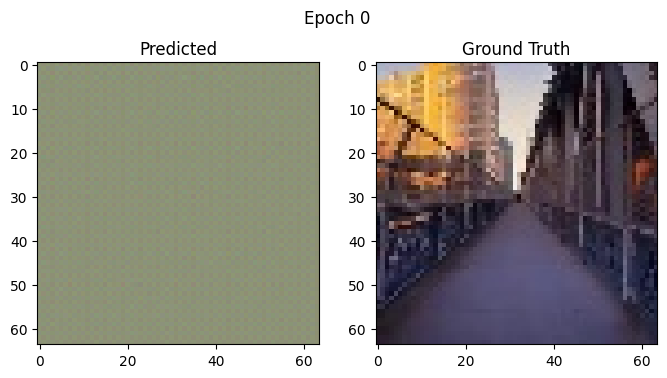

Epoch 4: 100%|██████████| 1894/1894 [00:11<00:00, 160.17it/s, v_num=62]    Validation loss: 20953.169921875


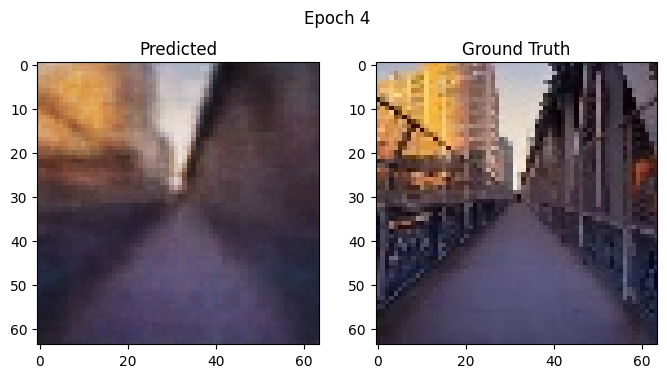

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 157.33it/s, v_num=62]Validation loss: 17648.1796875


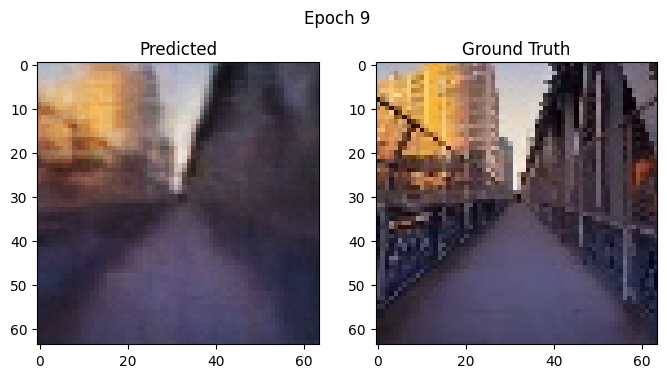

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 155.72it/s, v_num=62]Validation loss: 16252.787109375


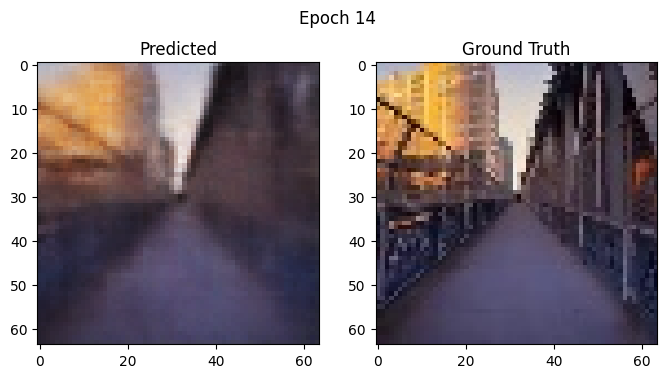

Epoch 19: 100%|██████████| 1894/1894 [00:12<00:00, 156.19it/s, v_num=62]Validation loss: 15484.9609375


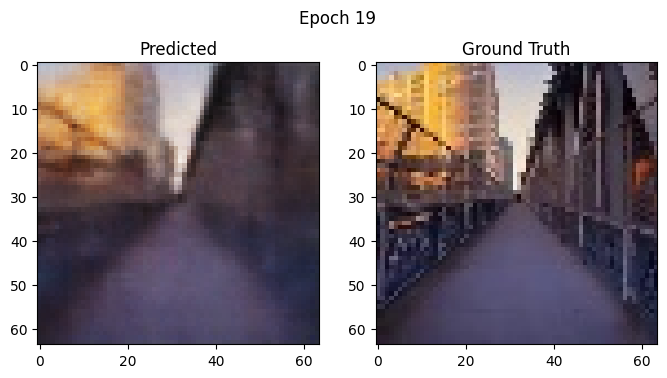

Epoch 24: 100%|██████████| 1894/1894 [00:12<00:00, 152.98it/s, v_num=62]Validation loss: 14648.3662109375


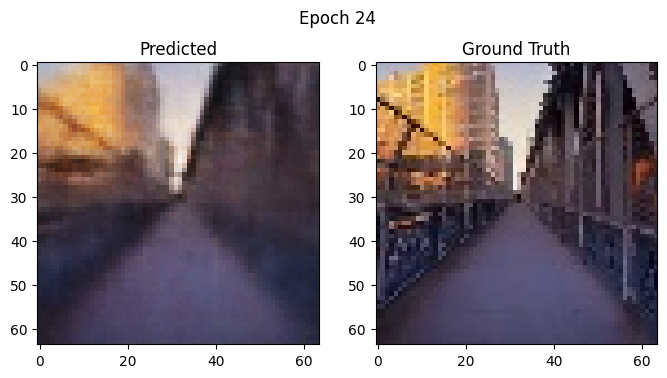

Epoch 29: 100%|██████████| 1894/1894 [00:12<00:00, 156.36it/s, v_num=62]Validation loss: 14515.84765625


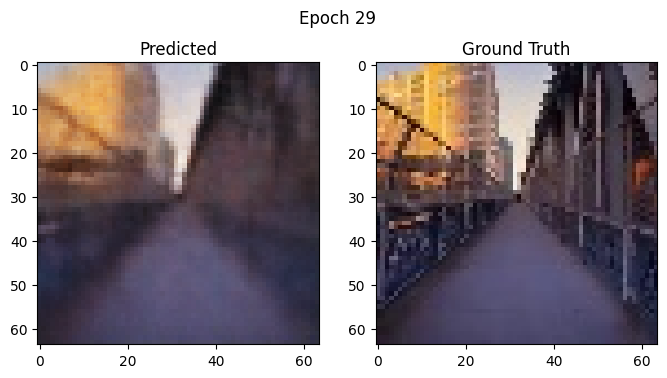

Epoch 29: 100%|██████████| 1894/1894 [00:13<00:00, 145.66it/s, v_num=62]

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 29: 100%|██████████| 1894/1894 [00:13<00:00, 145.64it/s, v_num=62]


In [20]:
trainer_vae.fit(vae_trainer, train_loader, val_loader)

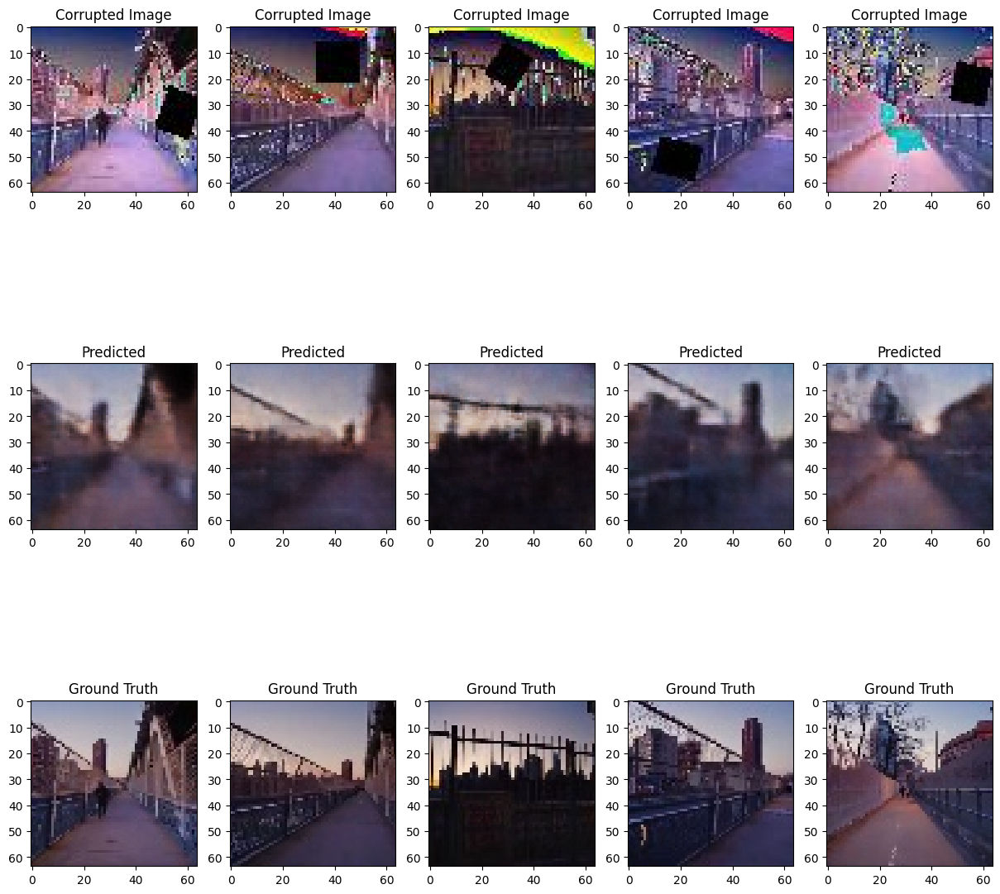

,MSE,NRMSE,PSNR,SSIM
max,0.038476,0.198488,31.863146,0.948974
mean,0.006533,0.080894,22.396871,0.658624
min,0.000521,0.025518,14.045308,0.270777


In [21]:
vae_metrics = evaluate(vae_trainer, test_loader)

### SimCLR - VAE

#### SimCLR

In [22]:
encoder_simclr= VAEEncoder(latent_dim=LATENT_DIM).to(device)

num_params = sum(p.numel() for p in encoder_simclr.parameters())
print(f"Encoder SimCLR has {num_params} parameters.")

Encoder SimCLR has 2224000 parameters.


In [23]:
simclr_trainer = SimCLR(encoder_simclr, latent_channels=LATENT_DIM, temp=0.07, learning_rate=1e-4, lambda_simclr=1.0, lambda_kl=0.6)

In [24]:
trainer_simclr = pl.Trainer(
    accelerator=device.type,
    max_epochs=15,
    check_val_every_n_epoch=1,
    limit_val_batches=1,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


In [25]:
trainer_simclr.fit(simclr_trainer, train_loader, val_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 14: 100%|██████████| 1894/1894 [00:18<00:00, 103.42it/s, v_num=63, train/loss=1.120]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:18<00:00, 102.96it/s, v_num=63, train/loss=1.120]


#### VAE

In [26]:
vae_simclr = VariationalAutoencoder(encoder_simclr, latent_dim=LATENT_DIM).to(device)
num_params = sum(p.numel() for p in vae_simclr.parameters())
print(f"Number of parameters: {num_params}")

vae_simclr_trainer = VAETrainer(vae_simclr, lr=1e-4)

Number of parameters: 4439299


In [27]:
trainer_vae_simclr = pl.Trainer(
    accelerator=device.type,
    max_epochs=EPOCHS,
    check_val_every_n_epoch=5,
    limit_val_batches=1,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 142375.15625


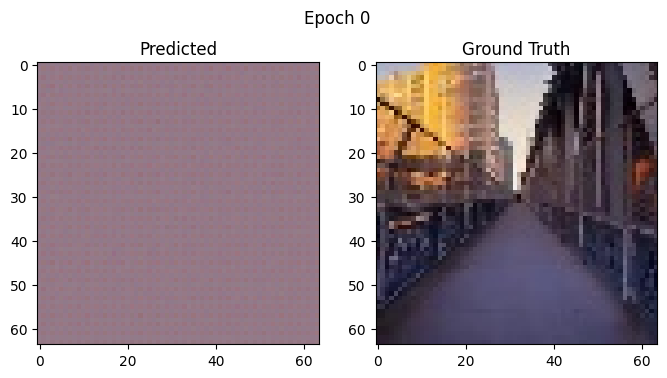

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 152.02it/s, v_num=64]    Validation loss: 25458.73828125


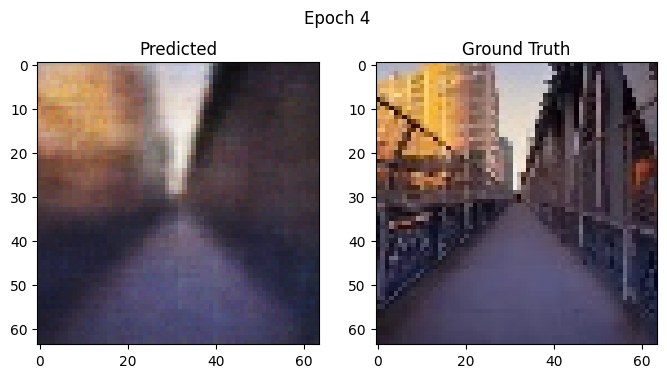

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 155.56it/s, v_num=64]Validation loss: 23164.984375


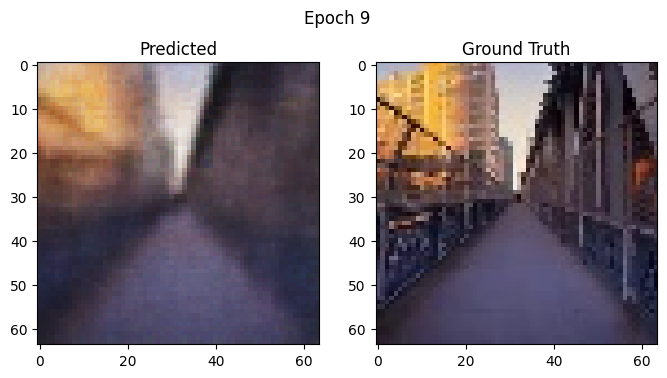

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 152.05it/s, v_num=64]Validation loss: 21196.9609375


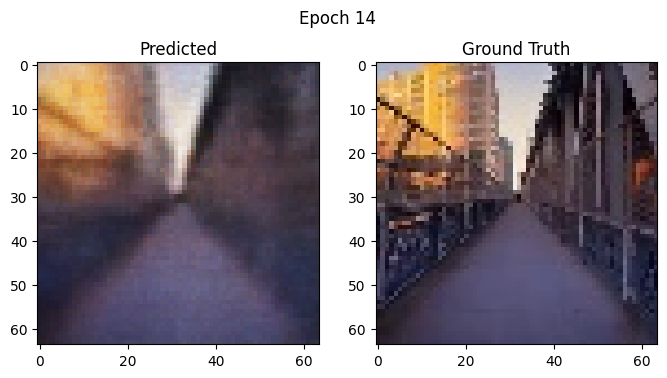

Epoch 19: 100%|██████████| 1894/1894 [00:12<00:00, 154.36it/s, v_num=64]Validation loss: 20398.35546875


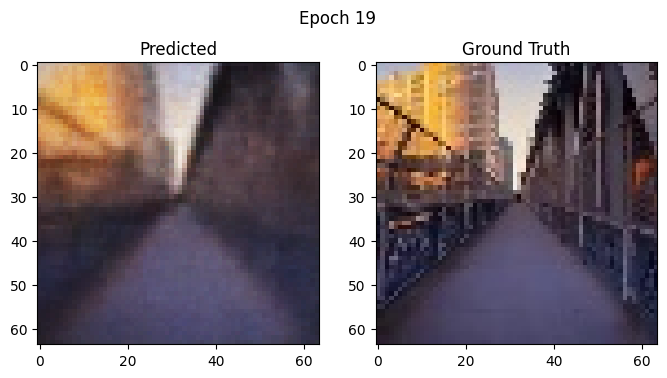

Epoch 24: 100%|██████████| 1894/1894 [00:12<00:00, 152.49it/s, v_num=64]Validation loss: 19335.927734375


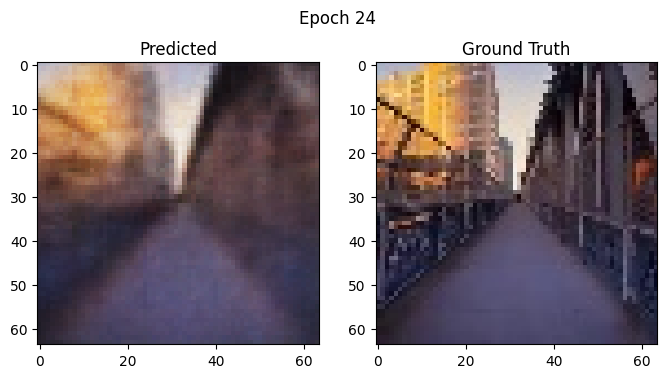

Epoch 29: 100%|██████████| 1894/1894 [00:12<00:00, 150.50it/s, v_num=64]Validation loss: 18339.5625


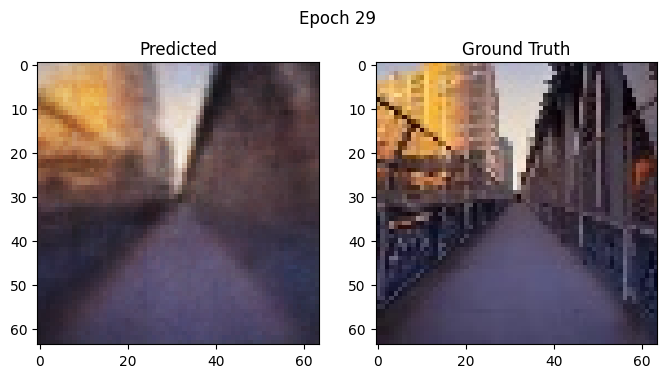

Epoch 29: 100%|██████████| 1894/1894 [00:13<00:00, 139.44it/s, v_num=64]

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 29: 100%|██████████| 1894/1894 [00:13<00:00, 139.43it/s, v_num=64]


In [28]:
trainer_vae_simclr.fit(vae_simclr_trainer, train_loader, val_loader)

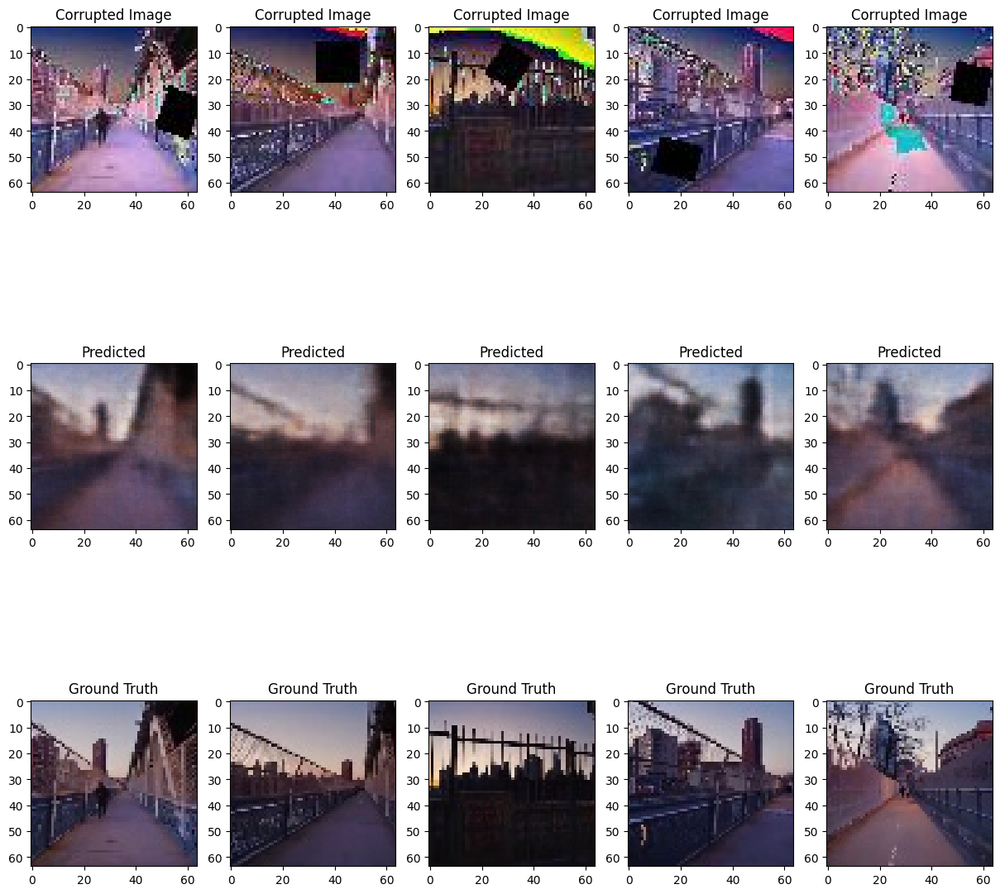

,MSE,NRMSE,PSNR,SSIM
max,0.038454,0.198432,30.968849,0.933943
mean,0.007291,0.085922,21.821067,0.627402
min,0.000640,0.028285,14.047761,0.253326


In [29]:
vae_simclr_metrics = evaluate(vae_simclr_trainer, test_loader)

### VAE - SimCLR - VAE

#### First VAE step

In [30]:
encoder_vcv = VAEEncoder(latent_dim=LATENT_DIM).to(device)

vae_vcv = VariationalAutoencoder(encoder_vcv, latent_dim=LATENT_DIM).to(device)

vae_vcv_trainer = VAETrainer(vae_vcv, lr=1e-4)

trainer_vae_vcv1 = pl.Trainer(
    accelerator=device.type,
    max_epochs=10,
    check_val_every_n_epoch=5,
    limit_val_batches=1,
)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 118322.4453125


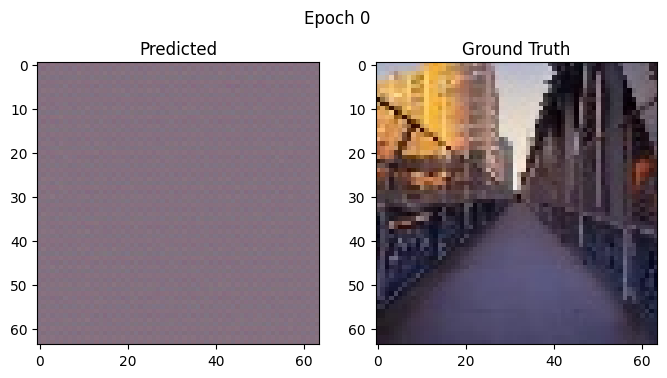

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 154.87it/s, v_num=65]    Validation loss: 23759.970703125


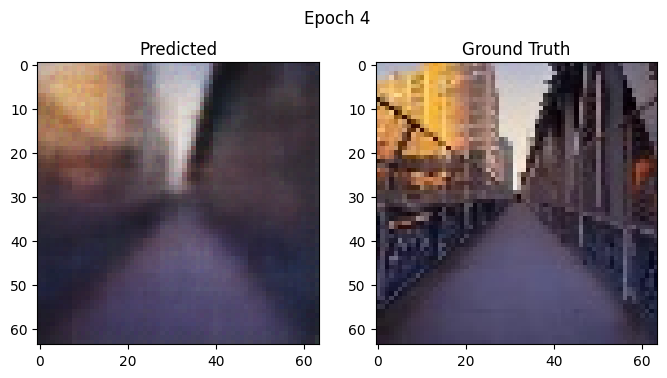

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 155.98it/s, v_num=65]Validation loss: 20895.283203125


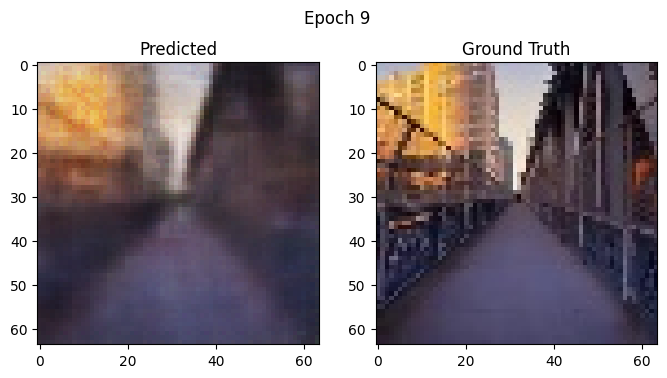

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 143.72it/s, v_num=65]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 143.70it/s, v_num=65]


In [31]:
trainer_vae_vcv1.fit(vae_vcv_trainer, train_loader, val_loader)

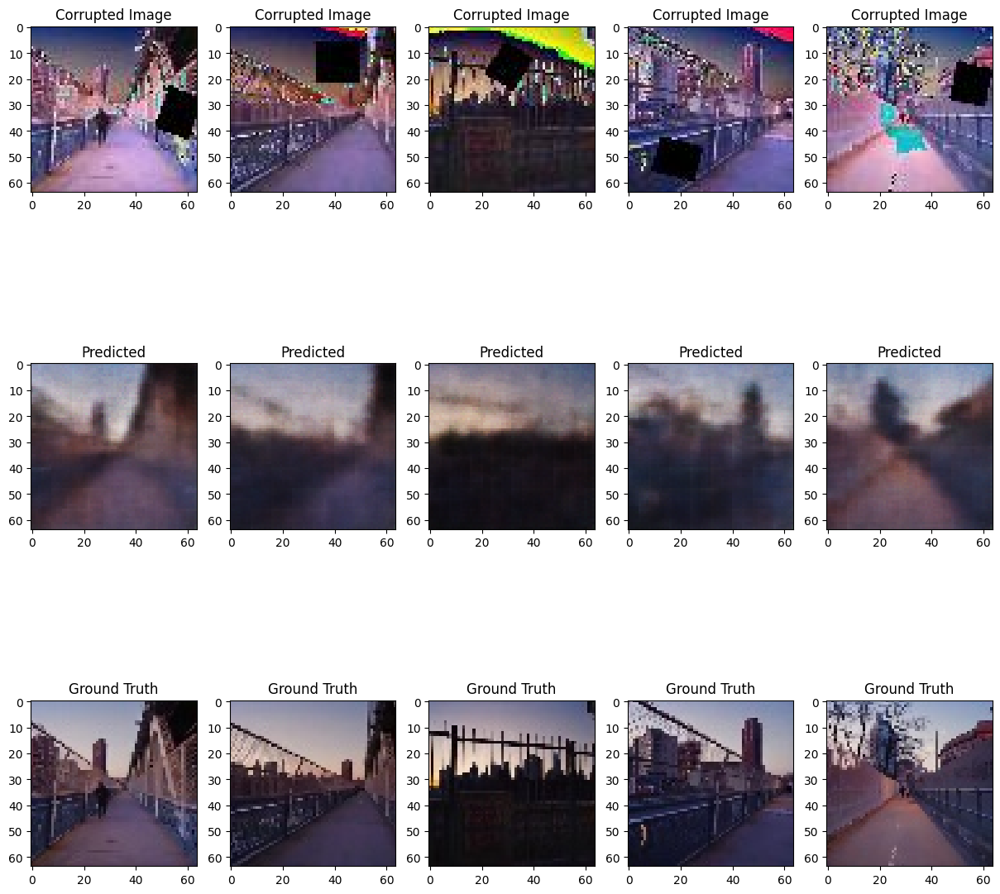

,MSE,NRMSE,PSNR,SSIM
max,0.039802,0.222154,29.454906,0.912854
mean,0.008181,0.091669,21.183783,0.594474
min,0.000922,0.033671,13.066909,0.223815


In [32]:
_ = evaluate(vae_vcv_trainer, test_loader)

#### SimCLR step

In [33]:
simclr_vcv_trainer = SimCLR(encoder_vcv, latent_channels=LATENT_DIM, temp=0.7,learning_rate=1e-4, lambda_simclr=1.0, lambda_kl=0.6)

trainer_simclr_vcv = pl.Trainer(
    accelerator=device.type,
    max_epochs=15,
    check_val_every_n_epoch=1,
    limit_val_batches=1,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


In [34]:
trainer_simclr_vcv.fit(simclr_vcv_trainer, train_loader, val_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | eval 
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 14: 100%|██████████| 1894/1894 [00:18<00:00, 101.44it/s, v_num=66, train/loss=1.480]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:18<00:00, 100.93it/s, v_num=66, train/loss=1.480]


#### Second VAE step

In [35]:
trainer_vae_vcv2 = pl.Trainer(
    accelerator=device.type,
    max_epochs=20,
    check_val_every_n_epoch=3,
    limit_val_batches=1,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode
--------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | eval
--------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 110029.875


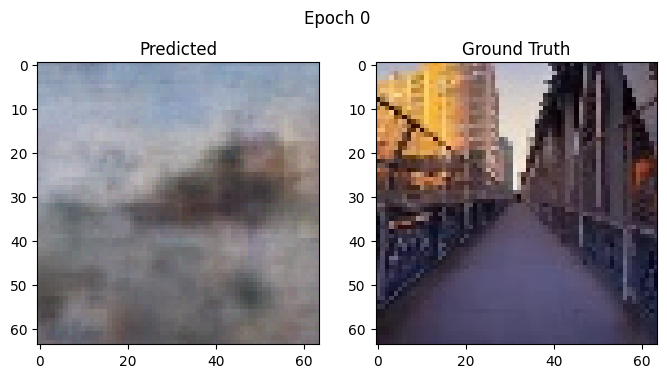

Epoch 2: 100%|██████████| 1894/1894 [00:12<00:00, 154.44it/s, v_num=67]    Validation loss: 20292.10546875


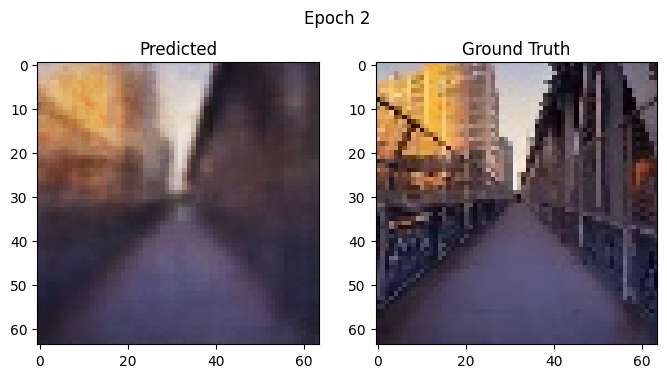

Epoch 5: 100%|██████████| 1894/1894 [00:12<00:00, 149.86it/s, v_num=67]Validation loss: 18960.51953125


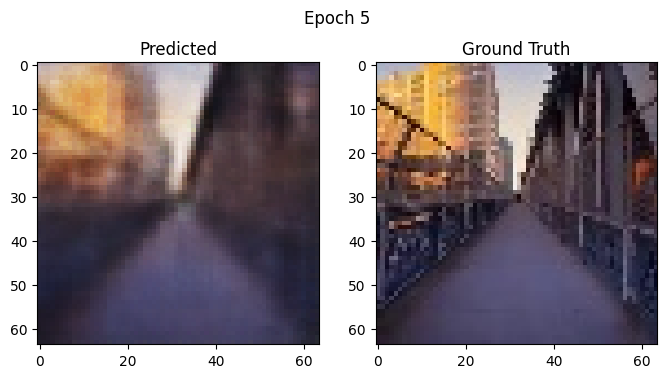

Epoch 8: 100%|██████████| 1894/1894 [00:12<00:00, 147.95it/s, v_num=67]Validation loss: 18091.35546875


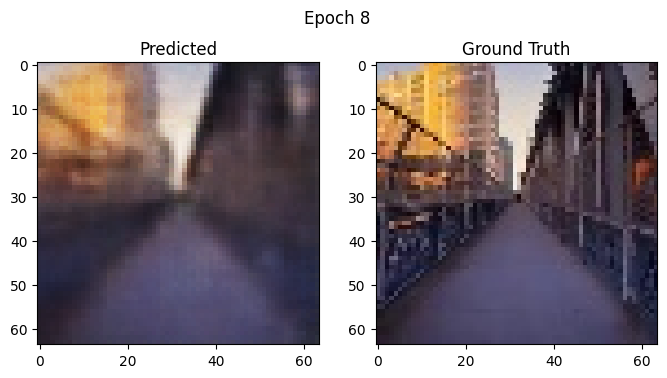

Epoch 11: 100%|██████████| 1894/1894 [00:12<00:00, 157.32it/s, v_num=67]Validation loss: 17690.83984375


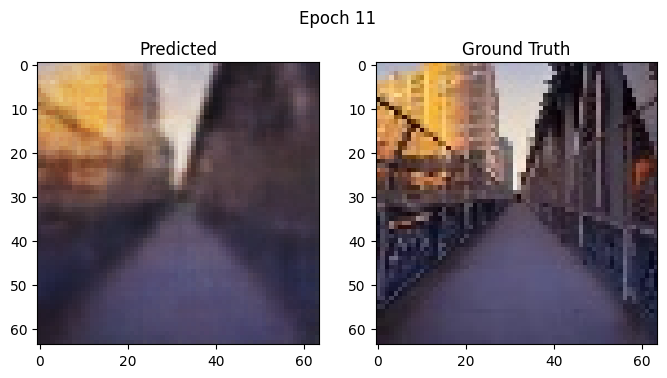

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 148.58it/s, v_num=67]Validation loss: 17103.666015625


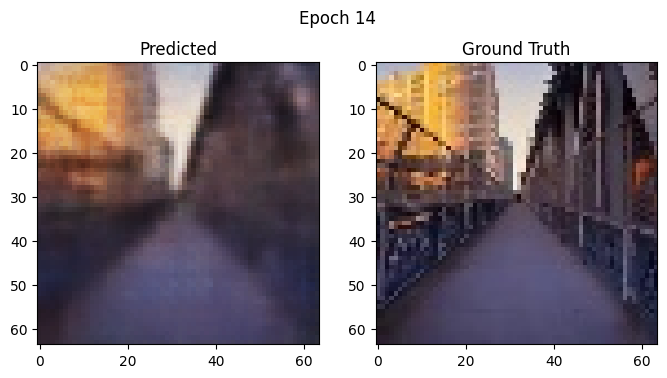

Epoch 17: 100%|██████████| 1894/1894 [00:12<00:00, 151.86it/s, v_num=67]Validation loss: 16682.05859375


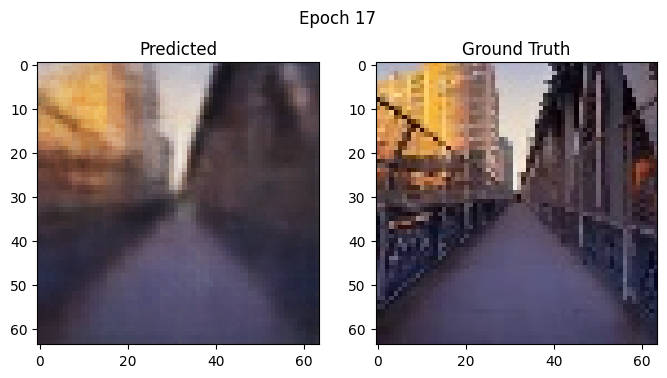

Epoch 19: 100%|██████████| 1894/1894 [00:12<00:00, 150.74it/s, v_num=67]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 1894/1894 [00:12<00:00, 150.72it/s, v_num=67]


In [36]:
trainer_vae_vcv2.fit(vae_vcv_trainer, train_loader, val_loader)

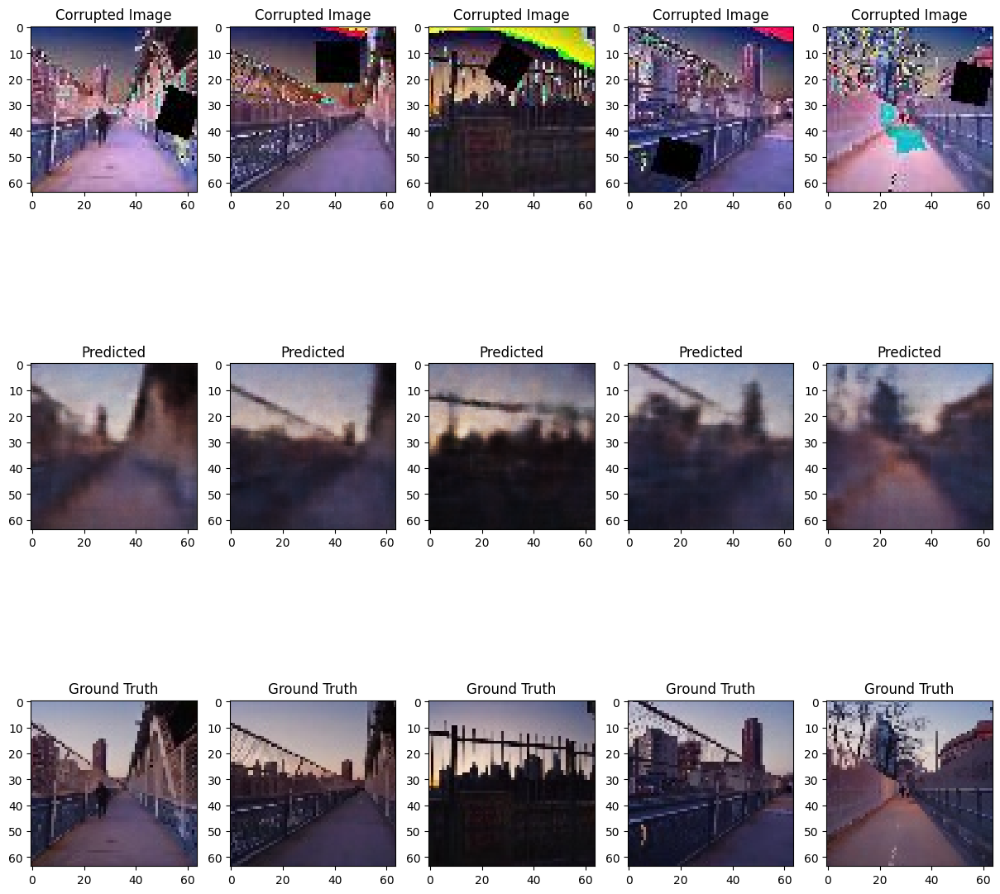

,MSE,NRMSE,PSNR,SSIM
max,0.035367,0.190455,30.883839,0.942072
mean,0.006719,0.082445,22.183629,0.648687
min,0.000652,0.028563,14.404139,0.254313


In [37]:
vcv_metrics = evaluate(vae_vcv_trainer, test_loader)

### Results

In [38]:
vae_metric = vae_metrics.describe().loc[["mean", "min", "max"]]
vae_simclr_metric = vae_simclr_metrics.describe().loc[["mean", "min", "max"]]
vcv_metric = vcv_metrics.describe().loc[["mean", "min", "max"]]

vae_metric['Model'] = 'VAE'
vae_simclr_metric['Model'] = 'SimCLR-VAE'
vcv_metric['Model'] = 'VAE-SimCLR-VAE'

all_metrics = pd.concat([vae_metric, vae_simclr_metric, vcv_metric])

display(all_metrics)

,MSE,NRMSE,PSNR,SSIM,Model
mean,0.006533,0.080894,22.396871,0.658624,VAE
min,0.000521,0.025518,14.045308,0.270777,VAE
max,0.038476,0.198488,31.863146,0.948974,VAE
mean,0.007291,0.085922,21.821067,0.627402,SimCLR-VAE
min,0.000640,0.028285,14.047761,0.253326,SimCLR-VAE
max,0.038454,0.198432,30.968849,0.933943,SimCLR-VAE
mean,0.006719,0.082445,22.183629,0.648687,VAE-SimCLR-VAE
min,0.000652,0.028563,14.404139,0.254313,VAE-SimCLR-VAE
max,0.035367,0.190455,30.883839,0.942072,VAE-SimCLR-VAE


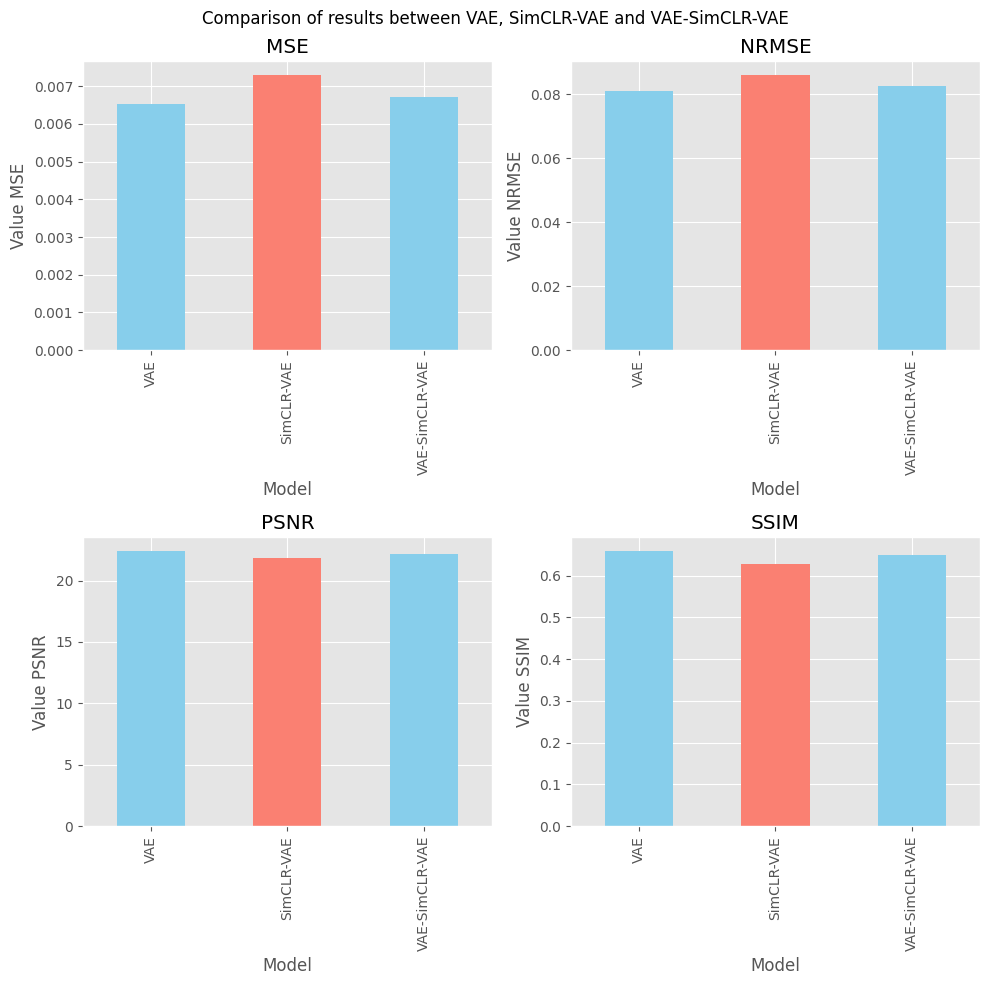

In [39]:
mean_metrics = all_metrics.loc['mean']
mean_metrics = mean_metrics.set_index('Model')

plt.style.use('ggplot')
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs = axs.flatten()

for idx, metric in enumerate(mean_metrics.columns):
    mean_metrics[metric].plot(kind='bar', ax=axs[idx], title=metric, color=['skyblue', 'salmon'])
    axs[idx].set_xticklabels(mean_metrics.index, rotation=90)
    axs[idx].set_ylabel(f'Value {metric}')
    axs[idx].set_xlabel('Model')

plt.suptitle('Comparison of results between VAE, SimCLR-VAE and VAE-SimCLR-VAE')
plt.tight_layout()
plt.show()

## Experiment with KL Lambda

### SimCLR - VAE

In [16]:
def train_simclr_vae(simclr_epochs: int, vae_epochs: int, kl_lambda: float, latent_dim: int) -> pd.DataFrame:
    """
    Train the SimCLR and VAE models and evaluate the results.

    Parameters
    ----------
    simclr_epochs : int
        Number of epochs to train the SimCLR model.
    vae_epochs : int
        Number of epochs to train the VAE model.
    kl_lambda : float
        Weight for the KL divergence loss in the VAE model.
    latent_dim : int
        Dimensionality of the latent space in the VAE model.

    Returns
    -------
    pd.DataFrame
        DataFrame containing the mean evaluation metrics for the trained VAE model.

    """
    encoder = VAEEncoder(latent_dim=latent_dim).to(device)
    simclr = SimCLR(encoder, latent_channels=latent_dim, learning_rate=1e-4, temp=0.07, lambda_simclr=1.0, lambda_kl=kl_lambda).to(device)
    print(f"SimCLR training with {simclr_epochs} epochs and kl_lambda={kl_lambda}")
    simclr_trainer = pl.Trainer(
        accelerator=device.type,
        max_epochs=simclr_epochs,
        check_val_every_n_epoch=5,
        limit_val_batches=1,
    )
    simclr_trainer.fit(simclr, train_loader, val_loader)

    vae = VariationalAutoencoder(encoder, latent_dim=latent_dim).to(device)
    vae_trainer = VAETrainer(vae, lr=1e-3)
    trainer_vae = pl.Trainer(
        accelerator=device.type,
        max_epochs=vae_epochs,
        check_val_every_n_epoch=5,
        limit_val_batches=1,
    )
    trainer_vae.fit(vae_trainer, train_loader, val_loader)

    metrics = evaluate(vae_trainer, test_loader)

    results = metrics.describe().loc[["mean"]]
    results['kl_lambda'] = kl_lambda

    return results

SimCLR training with 10 epochs and kl_lambda=0


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params

Epoch 9: 100%|██████████| 1894/1894 [00:17<00:00, 107.13it/s, v_num=18, train/loss=4.64e-6]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:17<00:00, 107.12it/s, v_num=18, train/loss=4.64e-6]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 351983.75


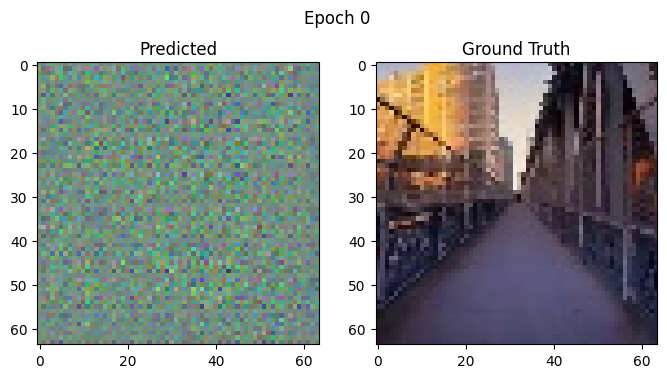

Epoch 4: 100%|██████████| 1894/1894 [00:11<00:00, 164.23it/s, v_num=19]    Validation loss: 21704.703125


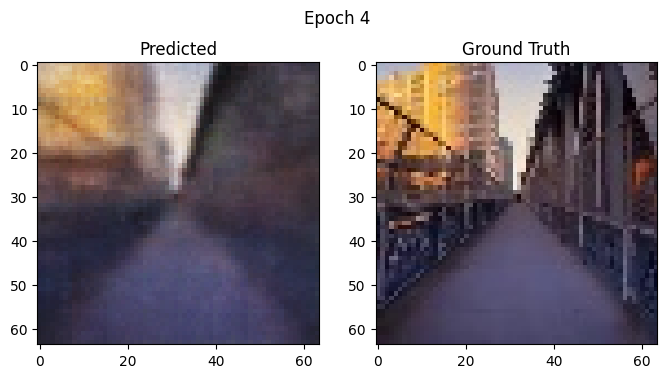

Epoch 9: 100%|██████████| 1894/1894 [00:11<00:00, 162.13it/s, v_num=19]Validation loss: 19276.0390625


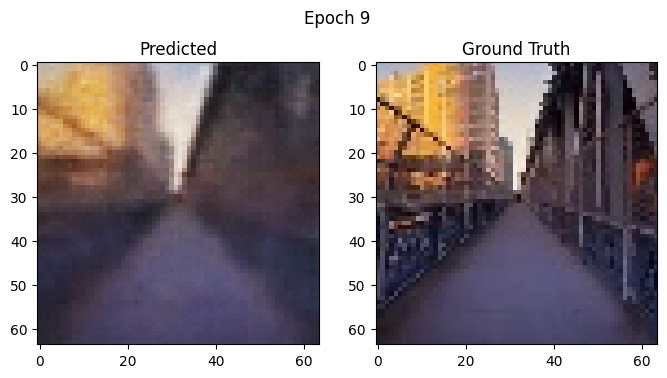

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 157.18it/s, v_num=19]Validation loss: 17380.40625


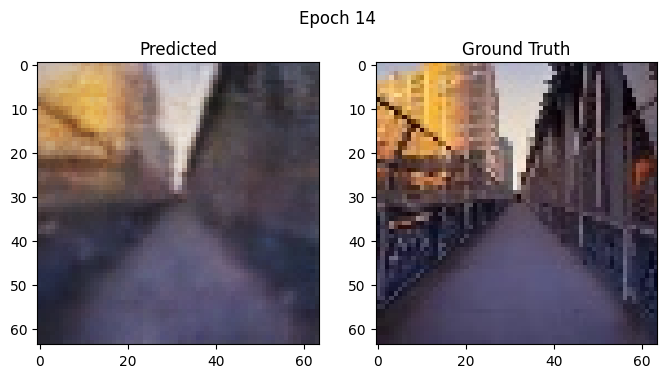

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 146.49it/s, v_num=19]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 146.47it/s, v_num=19]


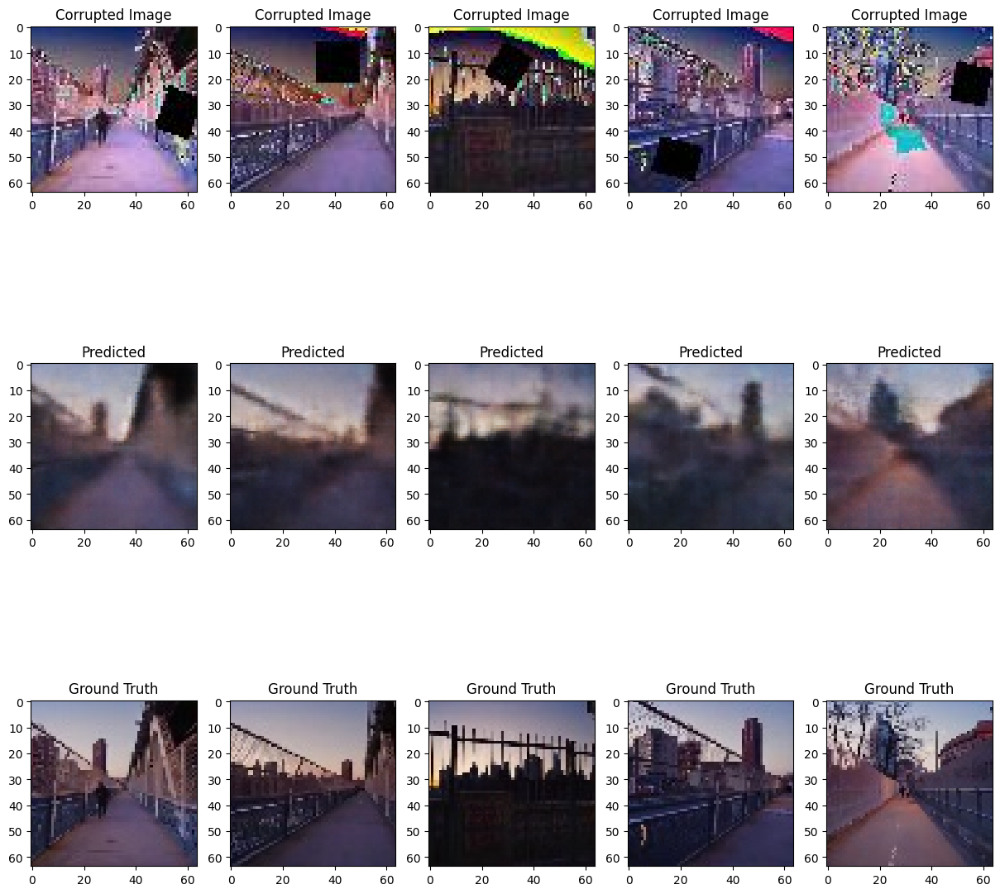

,MSE,NRMSE,PSNR,SSIM
max,0.037286,0.195395,31.537533,0.941437
mean,0.007647,0.087368,21.765164,0.629170
min,0.000561,0.026493,14.181724,0.200349


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


SimCLR training with 10 epochs and kl_lambda=0.1
Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 104.65it/s, v_num=20, train/loss=1.350]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 104.64it/s, v_num=20, train/loss=1.350]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 136853.078125


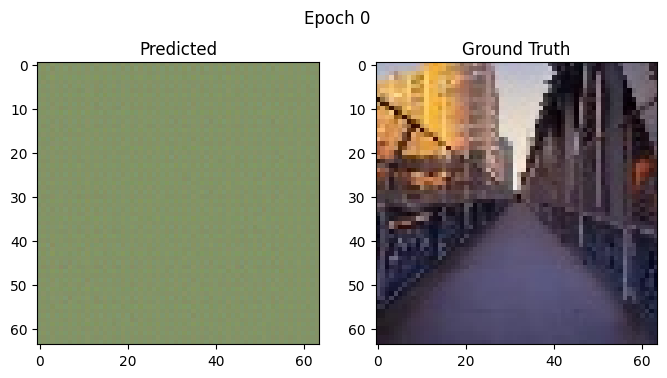

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 155.36it/s, v_num=21]    Validation loss: 21833.263671875


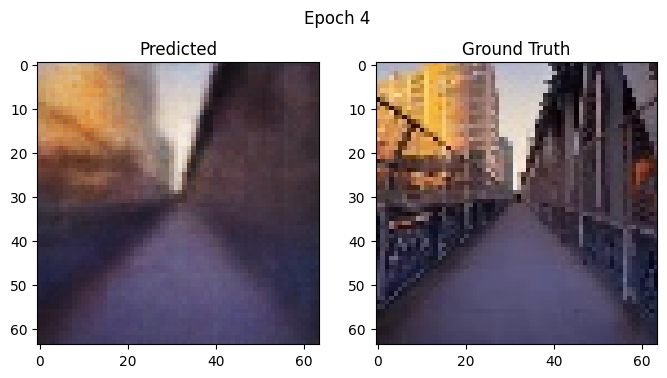

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 157.35it/s, v_num=21]Validation loss: 19328.25390625


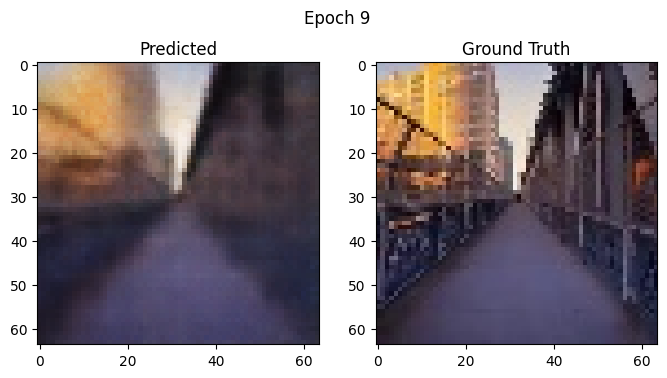

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 154.79it/s, v_num=21]Validation loss: 16919.814453125


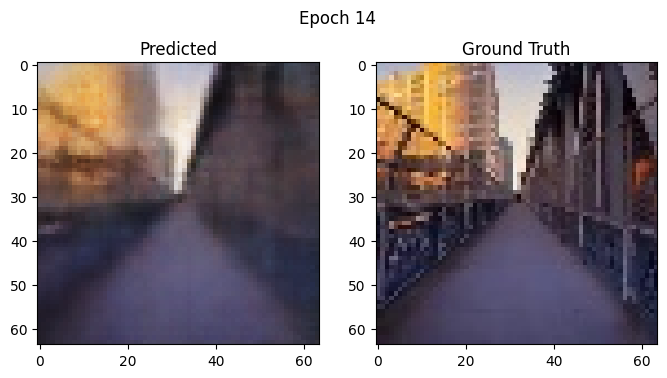

Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 143.97it/s, v_num=21]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 143.96it/s, v_num=21]


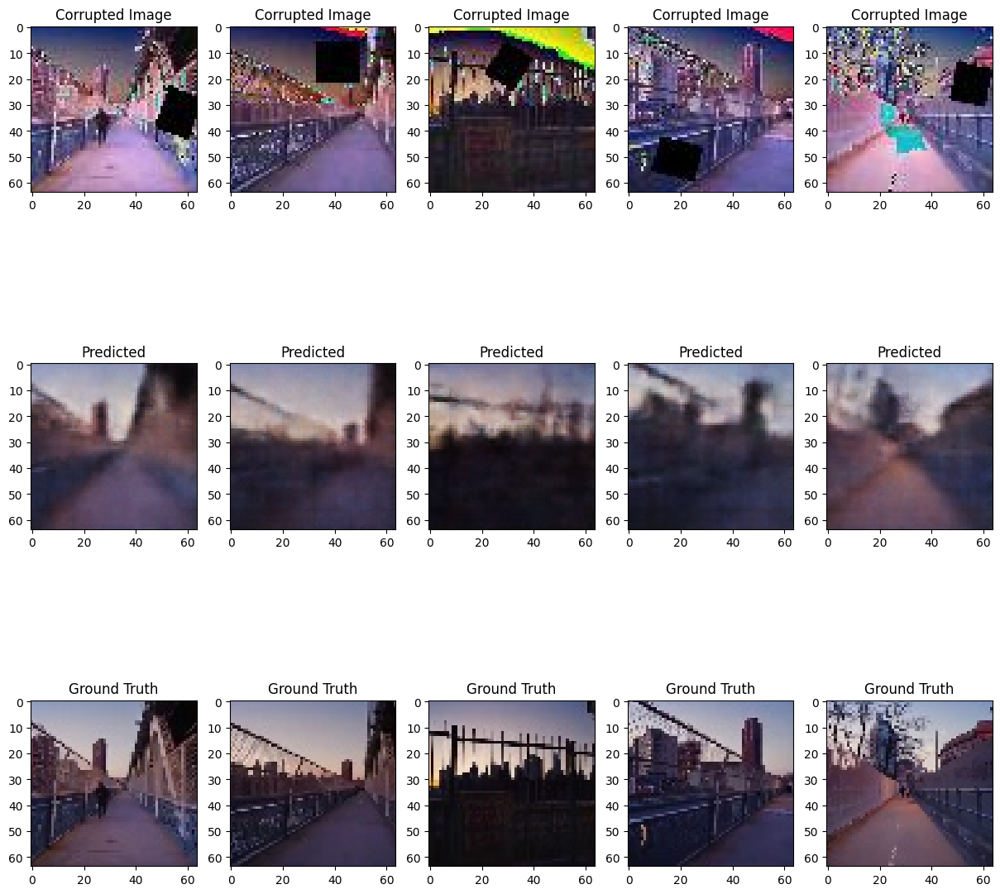

,MSE,NRMSE,PSNR,SSIM
max,0.039921,0.202181,30.900812,0.944592
mean,0.007164,0.084788,21.991343,0.640647
min,0.000650,0.028508,13.885199,0.250956


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


SimCLR training with 10 epochs and kl_lambda=0.3
Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 103.99it/s, v_num=22, train/loss=2.110]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 103.99it/s, v_num=22, train/loss=2.110]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 143382.171875


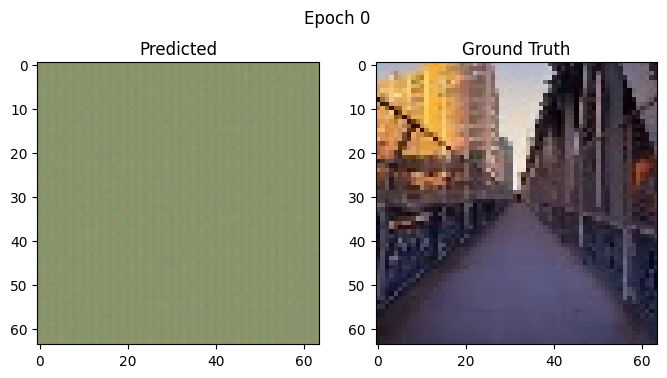

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 156.83it/s, v_num=23]    Validation loss: 28922.697265625


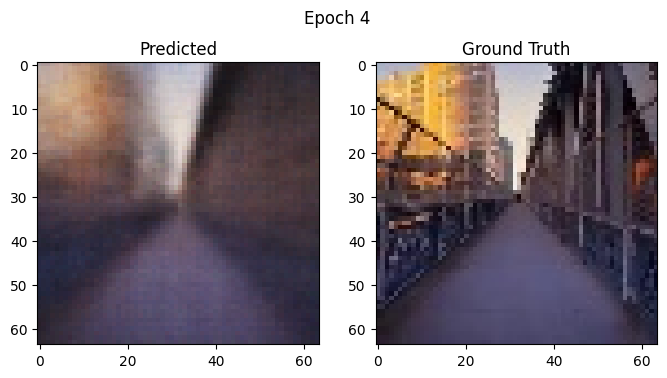

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 155.88it/s, v_num=23]Validation loss: 25575.3125


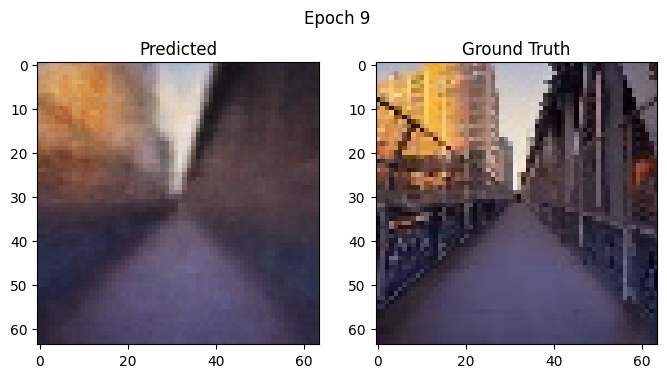

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 154.84it/s, v_num=23]Validation loss: 22979.814453125


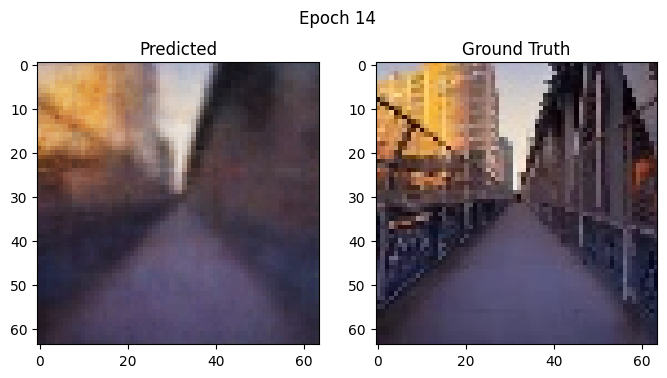

Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 144.10it/s, v_num=23]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 144.09it/s, v_num=23]


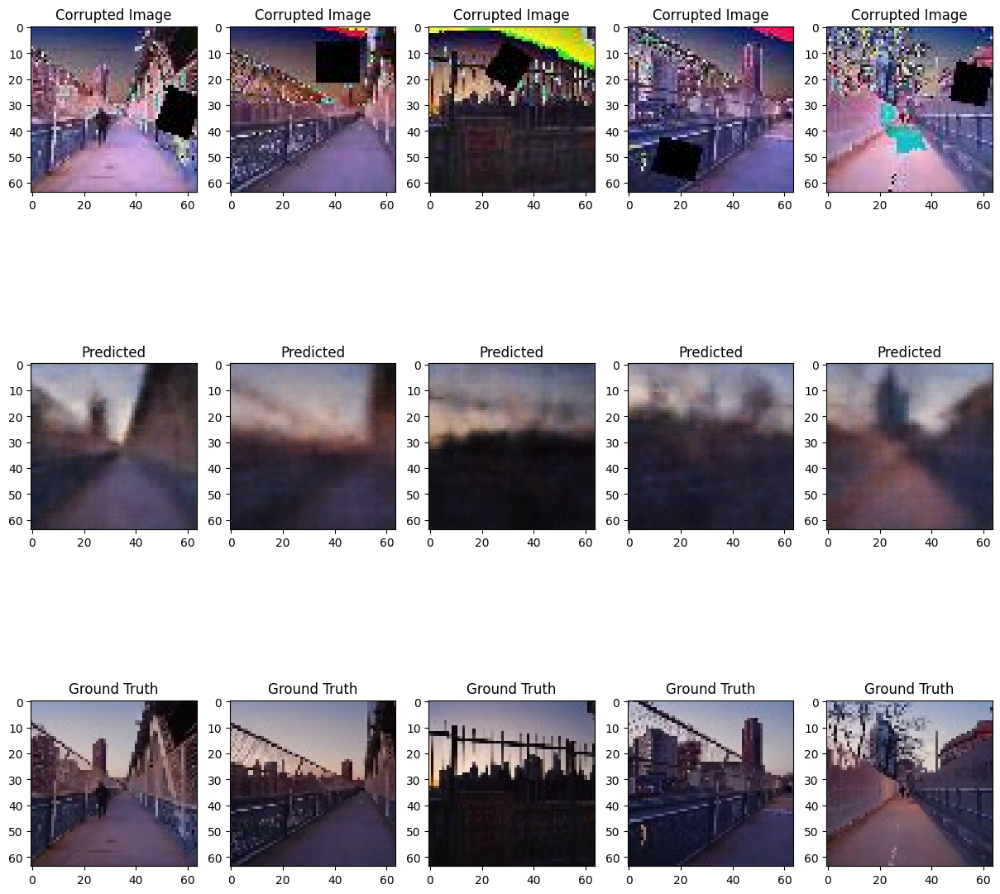

,MSE,NRMSE,PSNR,SSIM
max,0.043001,0.210424,30.165616,0.923916
mean,0.009876,0.099694,20.599978,0.582920
min,0.000770,0.031026,13.538079,0.148307


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


SimCLR training with 10 epochs and kl_lambda=0.6
Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 103.33it/s, v_num=24, train/loss=0.918]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 103.32it/s, v_num=24, train/loss=0.918]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 125777.640625


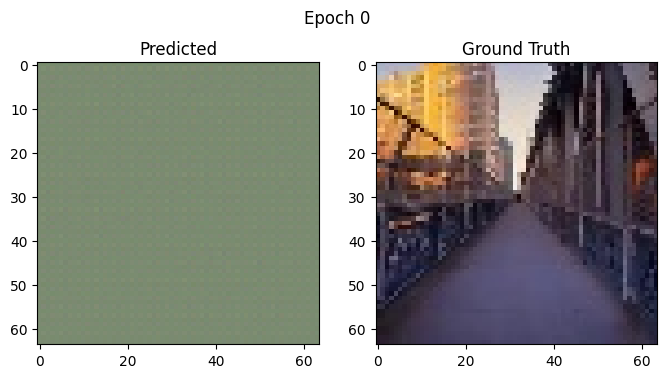

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 153.34it/s, v_num=25]    Validation loss: 20632.962890625


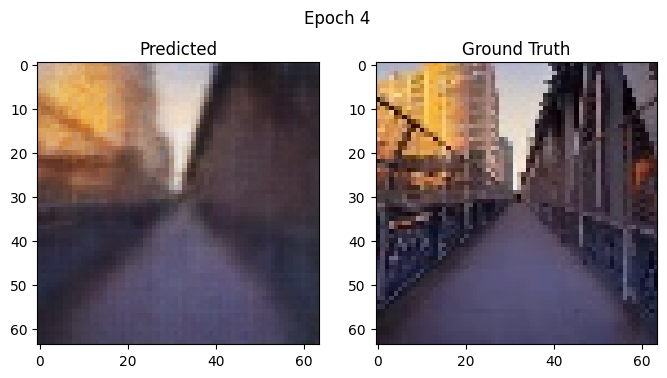

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 152.95it/s, v_num=25]Validation loss: 17081.666015625


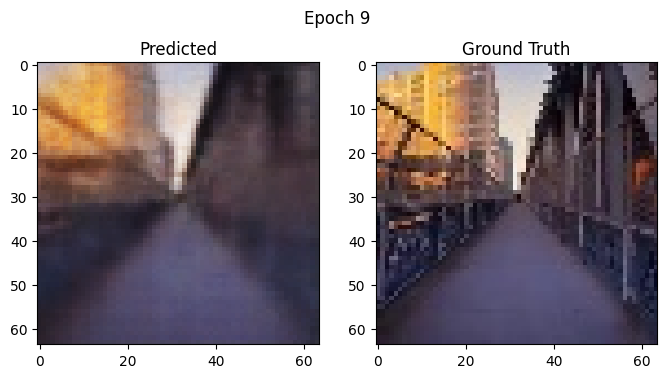

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 153.08it/s, v_num=25]Validation loss: 15589.439453125


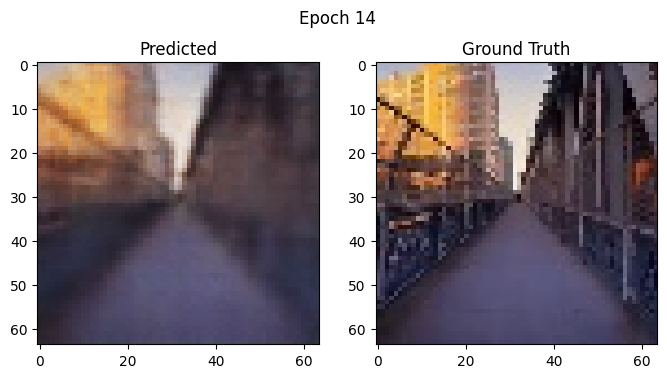

Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 142.20it/s, v_num=25]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 142.19it/s, v_num=25]


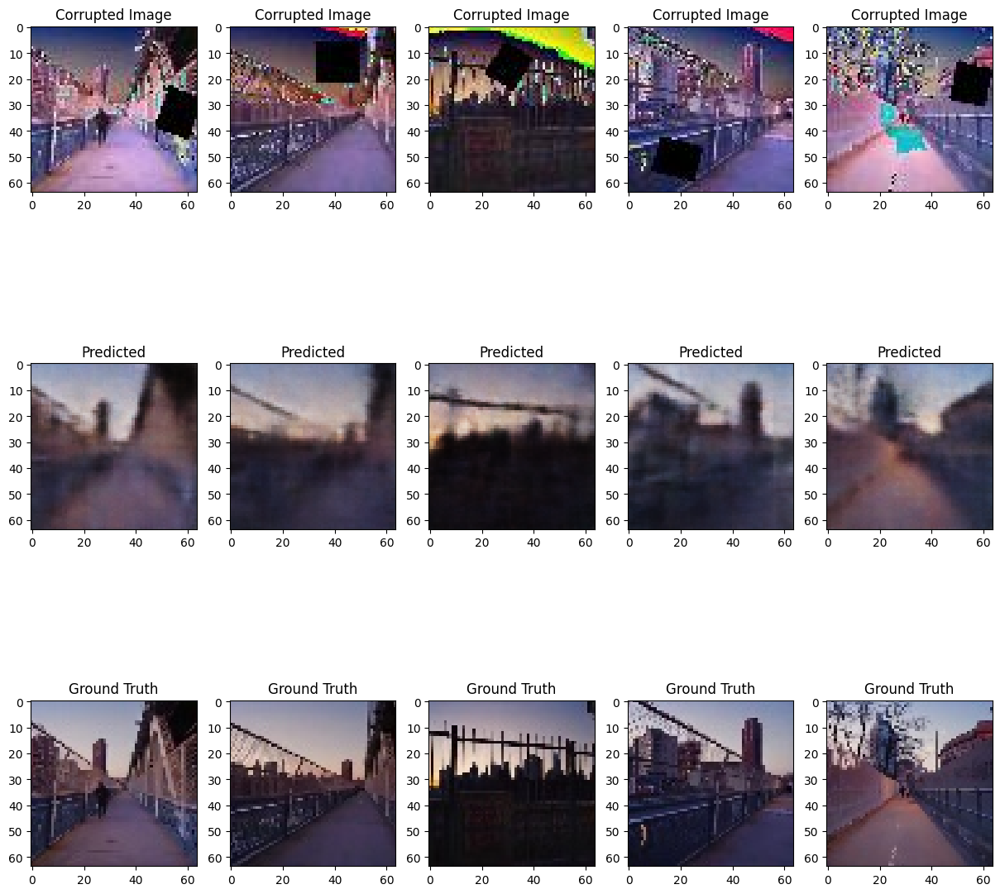

,MSE,NRMSE,PSNR,SSIM
max,0.035202,0.189857,30.740908,0.936844
mean,0.006999,0.084017,22.038856,0.642423
min,0.000674,0.029037,14.431483,0.245119


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


SimCLR training with 10 epochs and kl_lambda=0.9
Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 102.17it/s, v_num=26, train/loss=0.715]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 102.16it/s, v_num=26, train/loss=0.715]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 126759.59375


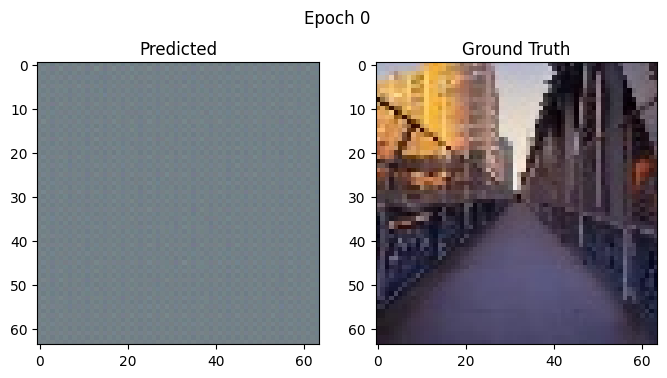

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 155.41it/s, v_num=27]    Validation loss: 27048.56640625


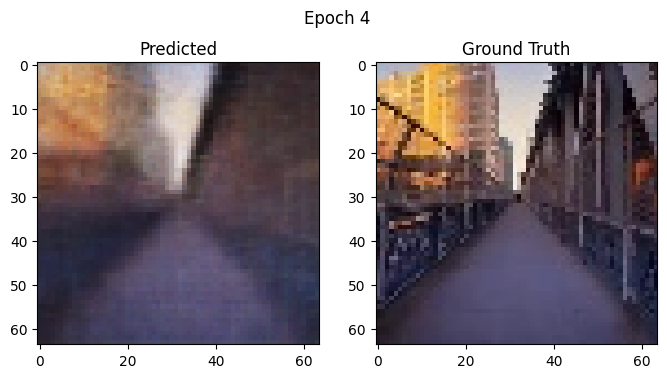

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 154.48it/s, v_num=27]Validation loss: 22594.099609375


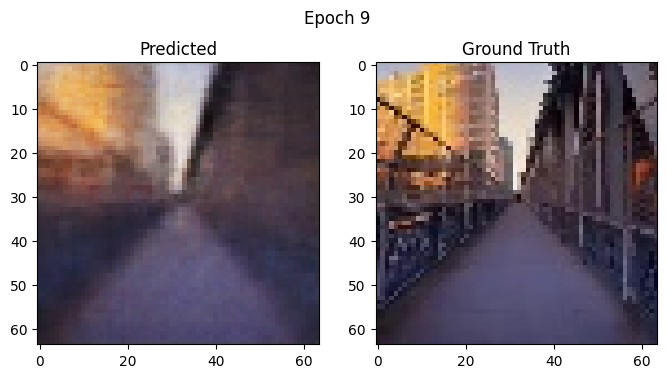

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 154.76it/s, v_num=27]Validation loss: 20960.068359375


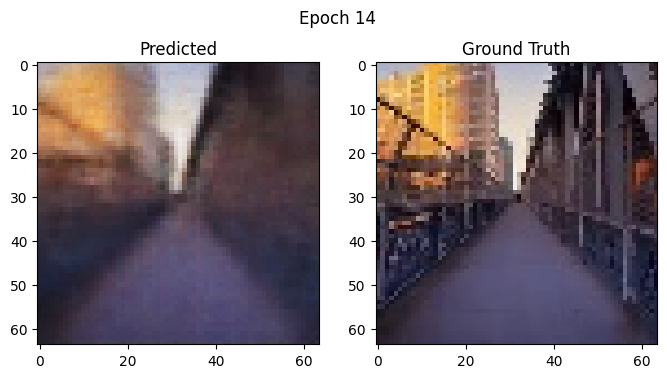

Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 143.33it/s, v_num=27]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 143.32it/s, v_num=27]


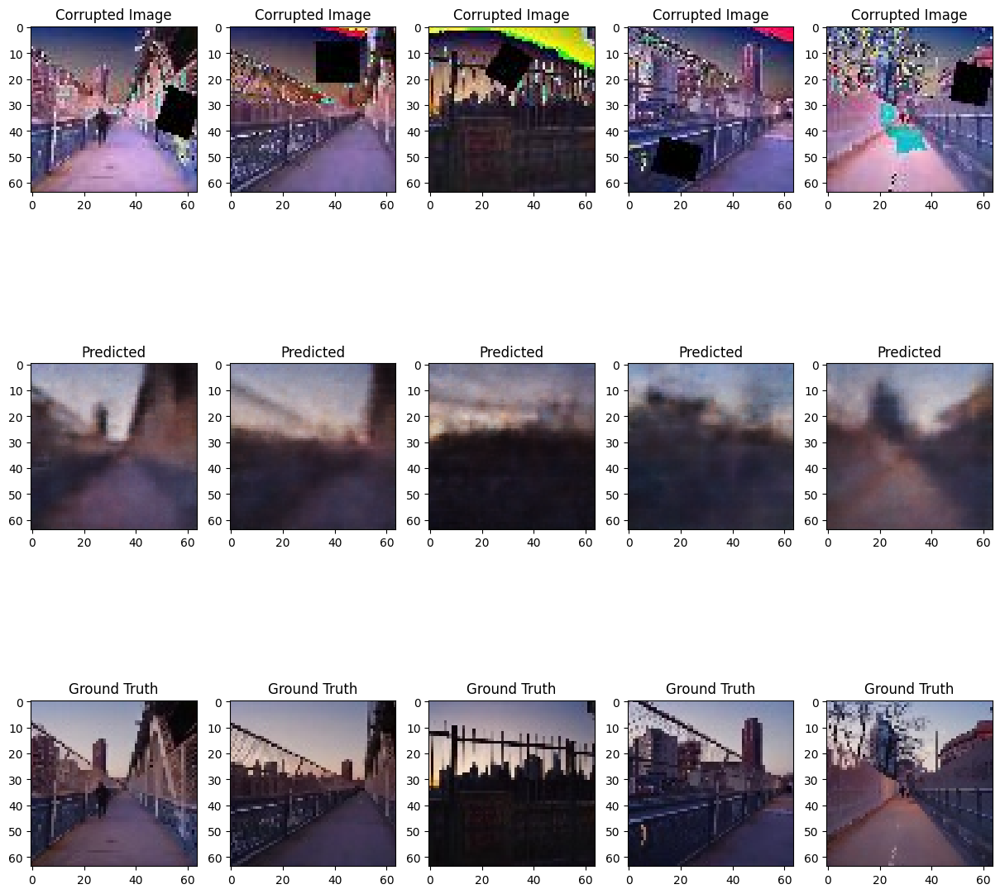

,MSE,NRMSE,PSNR,SSIM
max,0.039642,0.203121,30.460818,0.922013
mean,0.009157,0.096173,20.874752,0.589594
min,0.000719,0.029989,13.844883,0.197491


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


SimCLR training with 10 epochs and kl_lambda=1
Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 102.50it/s, v_num=28, train/loss=1.760]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 102.49it/s, v_num=28, train/loss=1.760]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 109344.40625


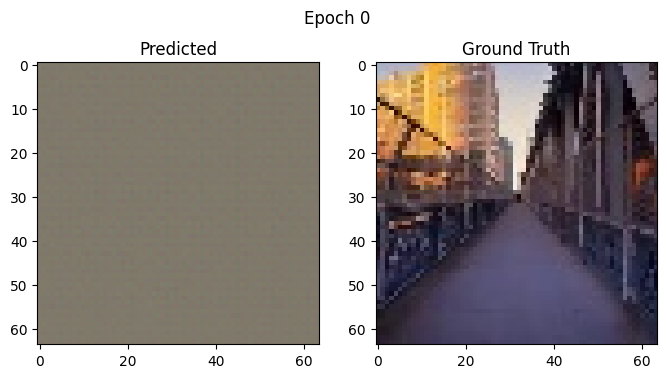

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 154.40it/s, v_num=29]    Validation loss: 24892.017578125


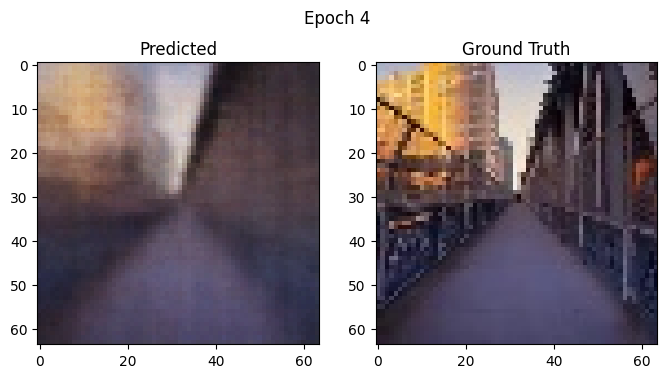

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 154.43it/s, v_num=29]Validation loss: 21861.908203125


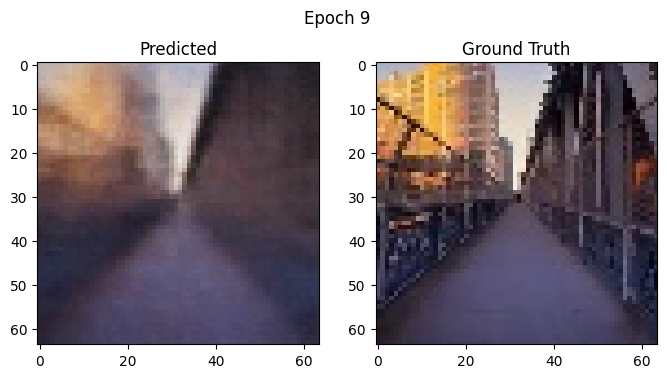

Epoch 14: 100%|██████████| 1894/1894 [00:12<00:00, 154.05it/s, v_num=29]Validation loss: 20881.361328125


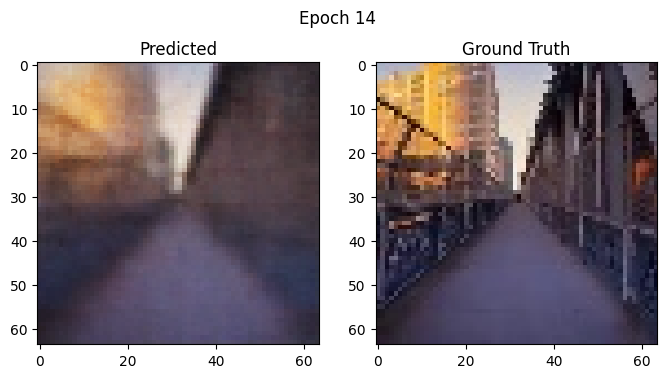

Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 143.02it/s, v_num=29]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 1894/1894 [00:13<00:00, 143.01it/s, v_num=29]


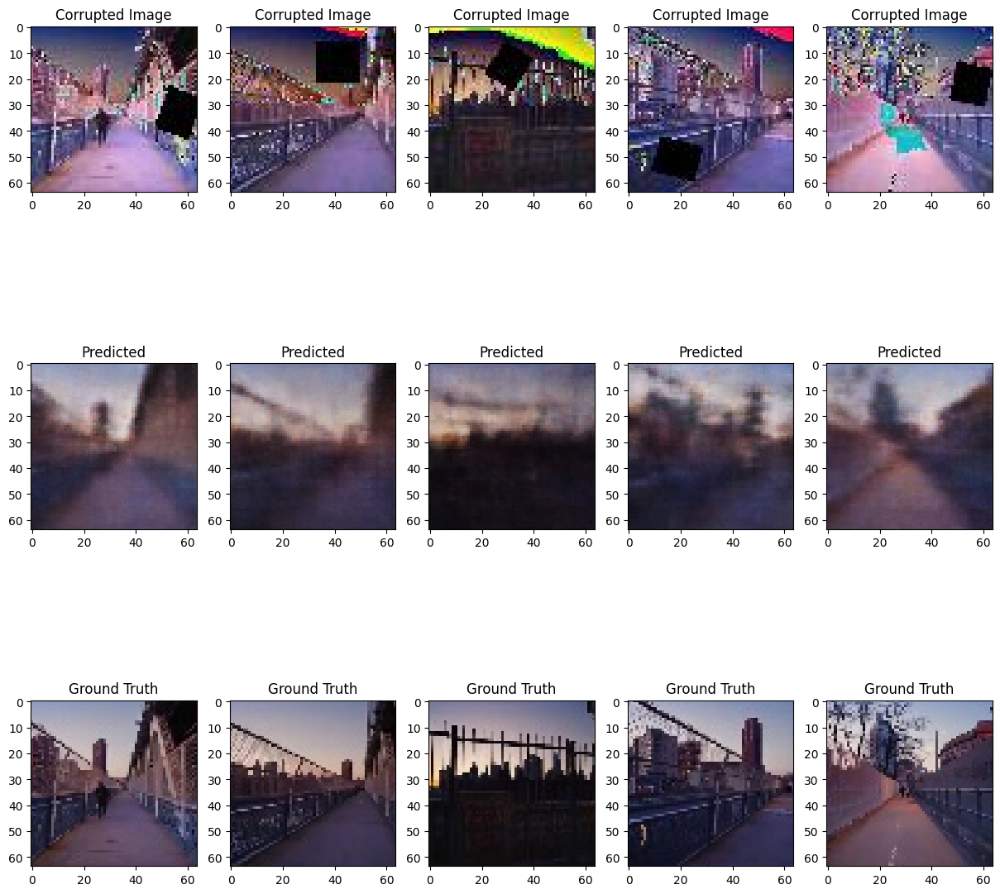

,MSE,NRMSE,PSNR,SSIM
max,0.037679,0.203120,30.789549,0.935248
mean,0.008832,0.093758,21.185915,0.602800
min,0.000667,0.028875,13.844957,0.183996


In [17]:
kl_lambdas = [0, 0.1, 0.3, 0.6, 0.9, 1]
kl_lambda_results = pd.DataFrame()

for kl_lambda in kl_lambdas:
    res = train_simclr_vae(
        simclr_epochs=10, 
        vae_epochs=15, 
        kl_lambda=kl_lambda, 
        latent_dim=64
    )
    kl_lambda_results = pd.concat([kl_lambda_results, res], ignore_index=True)

In [18]:
display(kl_lambda_results)

,MSE,NRMSE,PSNR,SSIM,kl_lambda
0,0.007647,0.087368,21.765164,0.629170,0.0
1,0.007164,0.084788,21.991343,0.640647,0.1
2,0.009876,0.099694,20.599978,0.582920,0.3
3,0.006999,0.084017,22.038856,0.642423,0.6
4,0.009157,0.096173,20.874752,0.589594,0.9
5,0.008832,0.093758,21.185915,0.602800,1.0


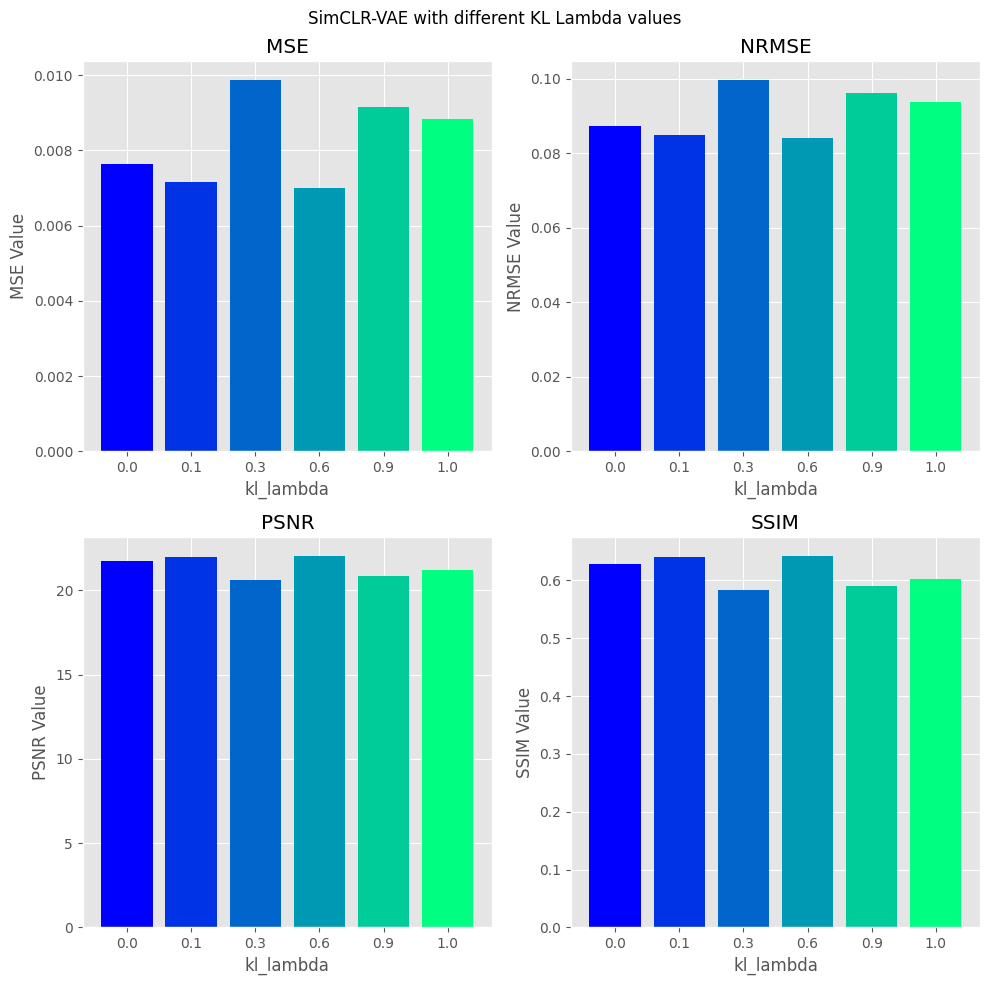

In [19]:
kl_lambda_results = kl_lambda_results.set_index('kl_lambda')
kl_lambda_results.index = kl_lambda_results.index.astype(str)

colors = cm.winter(np.linspace(0, 1, len(kl_lambda_results.index)))
plt.style.use('ggplot')

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].bar(kl_lambda_results.index, kl_lambda_results['MSE'], color=colors)
axs[0, 0].set_title('MSE')
axs[0, 0].set_xlabel('kl_lambda')
axs[0, 0].set_ylabel('MSE Value')

axs[0, 1].bar(kl_lambda_results.index, kl_lambda_results['NRMSE'], color=colors)
axs[0, 1].set_title('NRMSE')
axs[0, 1].set_xlabel('kl_lambda')
axs[0, 1].set_ylabel('NRMSE Value')

axs[1, 0].bar(kl_lambda_results.index, kl_lambda_results['PSNR'], color=colors)
axs[1, 0].set_title('PSNR')
axs[1, 0].set_xlabel('kl_lambda')
axs[1, 0].set_ylabel('PSNR Value')

axs[1, 1].bar(kl_lambda_results.index, kl_lambda_results['SSIM'], color=colors)
axs[1, 1].set_title('SSIM')
axs[1, 1].set_xlabel('kl_lambda')
axs[1, 1].set_ylabel('SSIM Value')

plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.suptitle('SimCLR-VAE with different KL Lambda values')
plt.tight_layout()
plt.show()

### VAE - SimCLR - VAE

In [16]:
def train_vcv(simclr_epochs: int, vae_epochs: int, kl_lambda: float, latent_dim: int) -> pd.DataFrame:
    """
    Train the SimCLR and VAE models and evaluate the results.

    Parameters
    ----------
    simclr_epochs : int
        Number of epochs to train the SimCLR model.
    vae_epochs : int
        Number of epochs to train the VAE model.
    kl_lambda : float
        Weight for the KL divergence loss in the VAE model.
    latent_dim : int
        Dimensionality of the latent space in the VAE model.

    Returns
    -------
    pd.DataFrame
        DataFrame containing the mean evaluation metrics for the trained VAE model.

    """
    encoder = VAEEncoder(latent_dim=latent_dim).to(device)

    vae = VariationalAutoencoder(encoder, latent_dim=latent_dim).to(device)
    vae_trainer = VAETrainer(vae, lr=1e-3)

    trainer_vae1 = pl.Trainer(
        accelerator=device.type,
        max_epochs=int(vae_epochs//3),
        check_val_every_n_epoch=5,
        limit_val_batches=1,
    )
    print(f"VAE-1 training with {vae_epochs//3} epochs")
    trainer_vae1.fit(vae_trainer, train_loader, val_loader)

    simclr = SimCLR(encoder, latent_channels=latent_dim, learning_rate=1e-4, temp=0.07, lambda_simclr=1.0, lambda_kl=kl_lambda).to(device)
    print(f"SimCLR training with {simclr_epochs} epochs and kl_lambda={kl_lambda}")
    simclr_trainer = pl.Trainer(
        accelerator=device.type,
        max_epochs=simclr_epochs,
        check_val_every_n_epoch=5,
        limit_val_batches=1,
    )
    simclr_trainer.fit(simclr, train_loader, val_loader)


    trainer_vae2 = pl.Trainer(
        accelerator=device.type,
        max_epochs=int((2*vae_epochs) // 3),
        check_val_every_n_epoch=5,
        limit_val_batches=1,
    )
    print(f"VAE-2 training with {2*vae_epochs//3} epochs")
    trainer_vae2.fit(vae_trainer, train_loader, val_loader)

    metrics = evaluate(vae_trainer, test_loader)

    results = metrics.describe().loc[["mean"]]
    results['kl_lambda'] = kl_lambda

    return results

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
You are using a CUDA device ('NVIDIA GeForce RTX 4070 SUPER') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


VAE-1 training with 5 epochs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 149071.546875


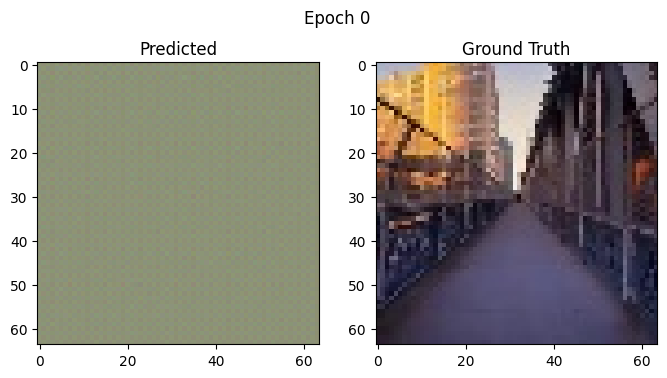

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 155.20it/s, v_num=69]    Validation loss: 20888.935546875


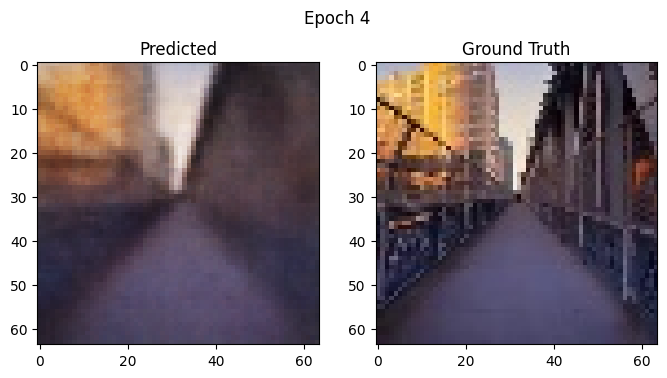

Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 145.03it/s, v_num=69]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 145.02it/s, v_num=69]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


SimCLR training with 10 epochs and kl_lambda=0


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 1894/1894 [00:19<00:00, 96.36it/s, v_num=70, train/loss=1.5e-5]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:19<00:00, 96.35it/s, v_num=70, train/loss=1.5e-5]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


VAE-2 training with 10 epochs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 115486.0078125


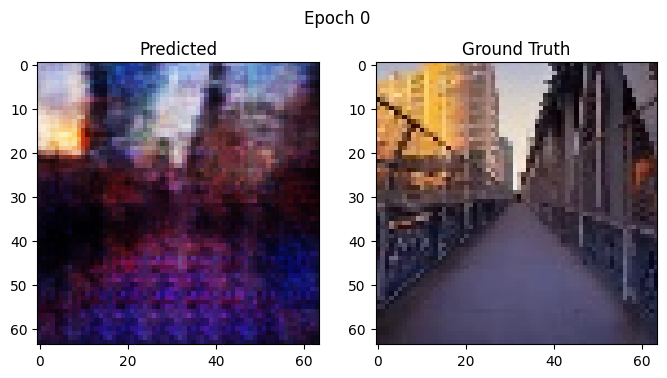

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 146.79it/s, v_num=71]    Validation loss: 17625.734375


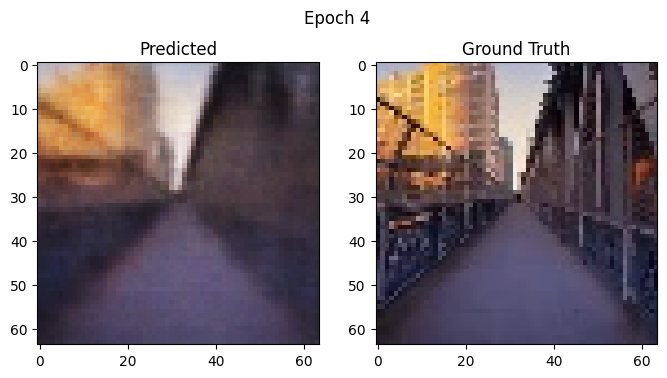

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 146.48it/s, v_num=71]Validation loss: 16075.57421875


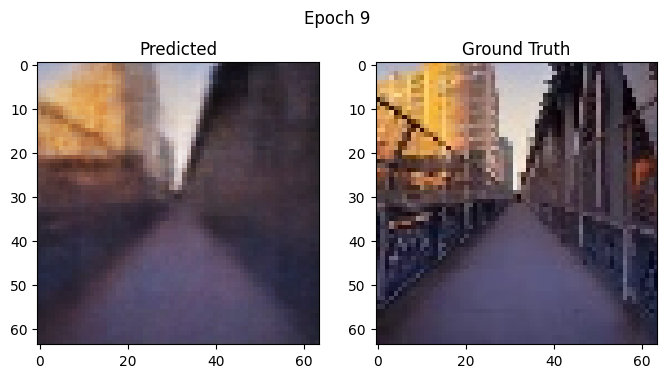

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 136.16it/s, v_num=71]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 136.15it/s, v_num=71]


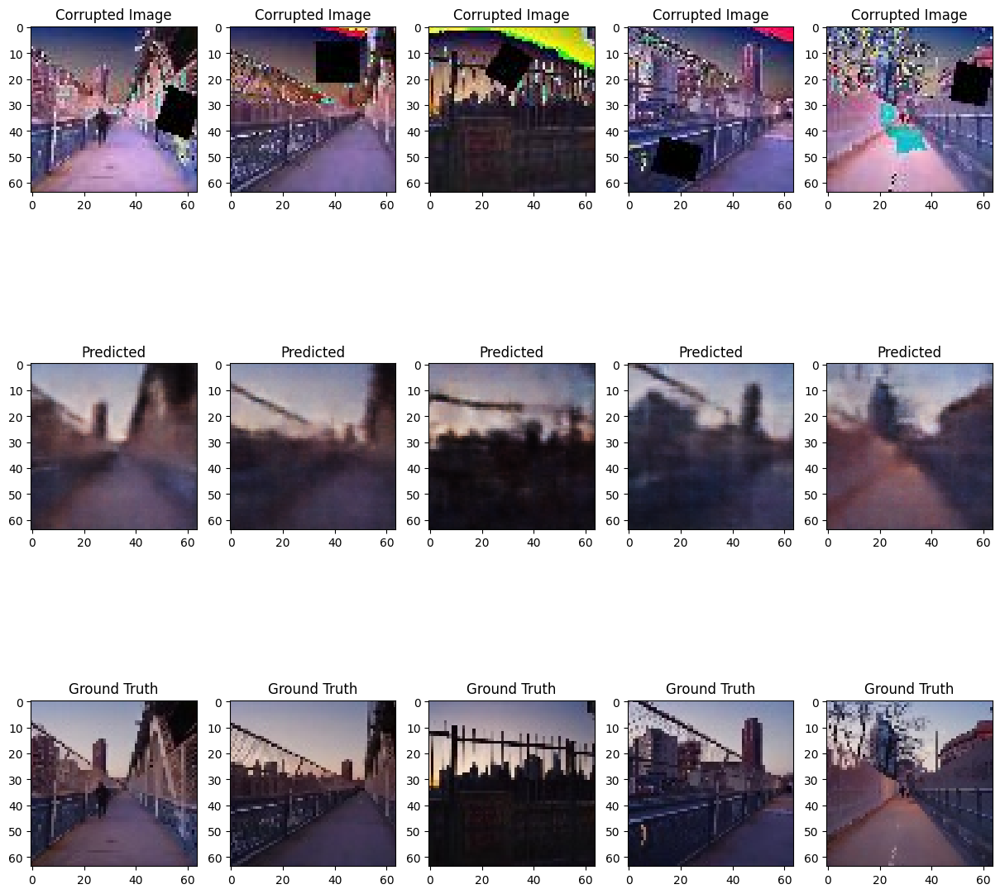

,MSE,NRMSE,PSNR,SSIM
max,0.034824,0.188833,31.070089,0.939880
mean,0.007003,0.083972,22.052820,0.642594
min,0.000625,0.027957,14.478427,0.232827


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-1 training with 5 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 114416.7578125


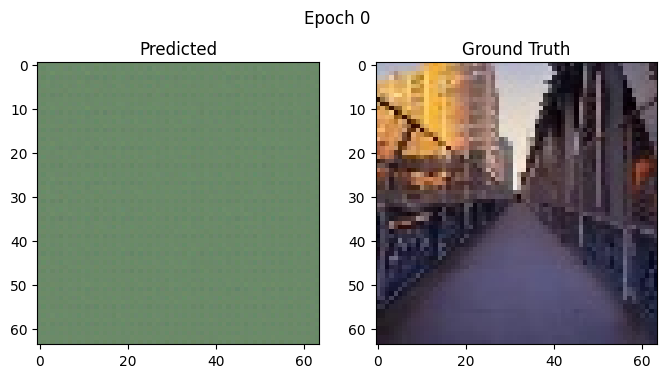

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 157.26it/s, v_num=72]    Validation loss: 20160.8515625


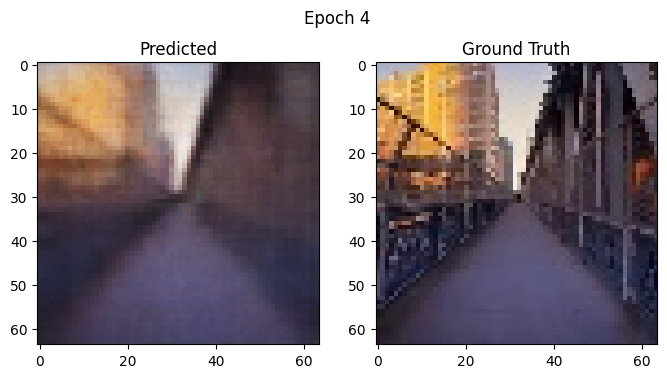

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 146.10it/s, v_num=72]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 146.09it/s, v_num=72]
SimCLR training with 10 epochs and kl_lambda=0.1


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 1894/1894 [00:19<00:00, 97.82it/s, v_num=73, train/loss=0.530] 

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:19<00:00, 97.81it/s, v_num=73, train/loss=0.530]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


VAE-2 training with 10 epochs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 120330.7109375


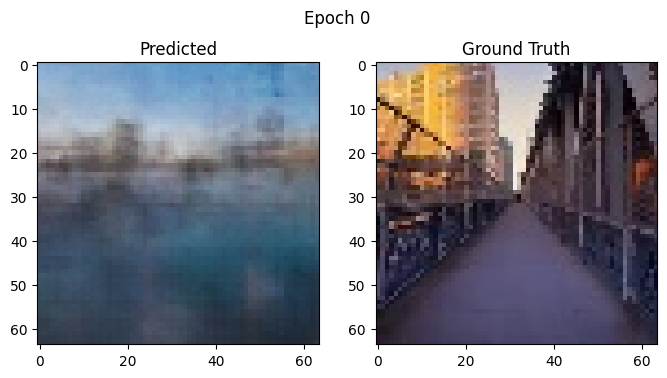

Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 136.66it/s, v_num=74]    Validation loss: 17411.2734375


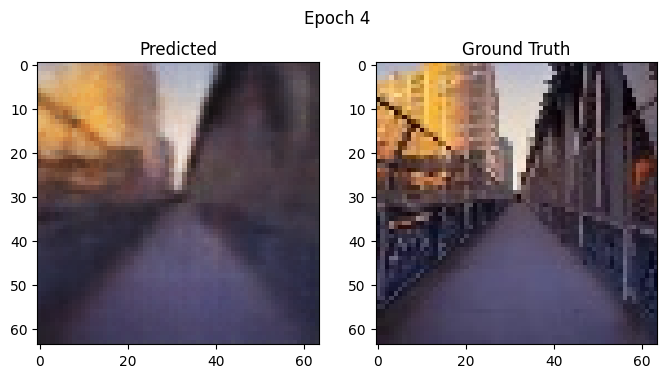

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 149.23it/s, v_num=74]Validation loss: 15950.3359375


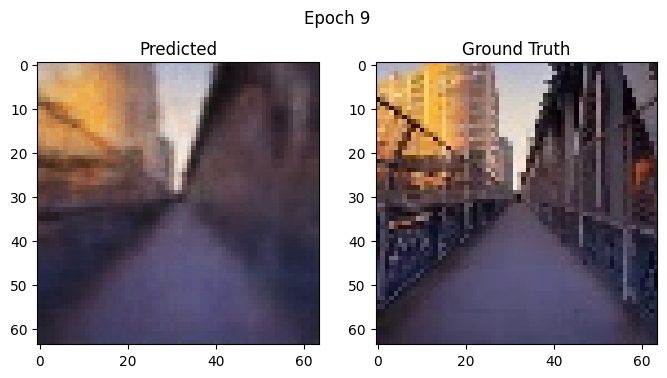

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 138.27it/s, v_num=74]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 138.26it/s, v_num=74]


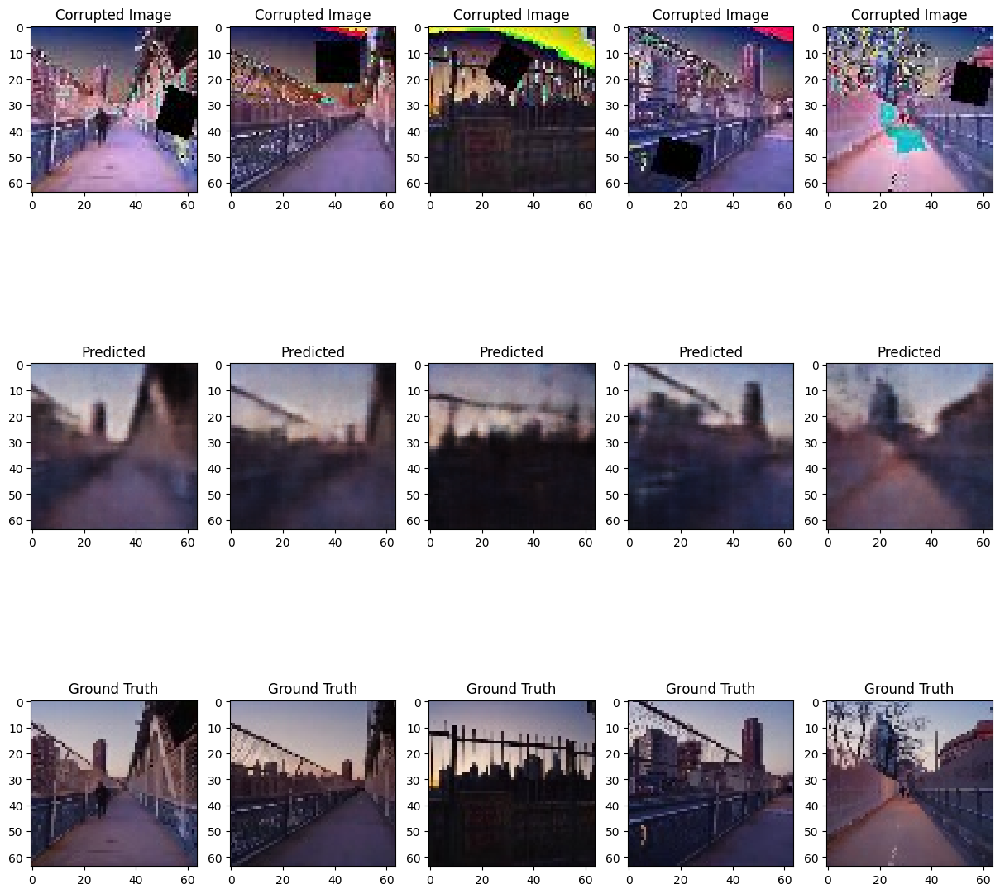

,MSE,NRMSE,PSNR,SSIM
max,0.037255,0.195315,30.633022,0.938876
mean,0.006926,0.083548,22.086165,0.644608
min,0.000703,0.029400,14.185304,0.256850


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-1 training with 5 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 116149.609375


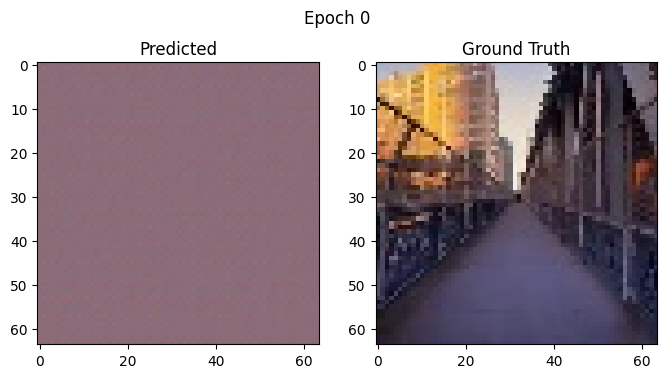

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 151.62it/s, v_num=75]    Validation loss: 20835.244140625


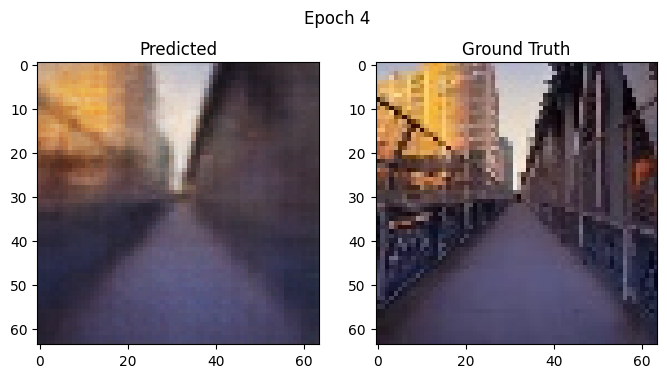

Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 140.94it/s, v_num=75]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 140.93it/s, v_num=75]
SimCLR training with 10 epochs and kl_lambda=0.3


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.42it/s, v_num=76, train/loss=1.090]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.41it/s, v_num=76, train/loss=1.090]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


VAE-2 training with 10 epochs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 105030.9375


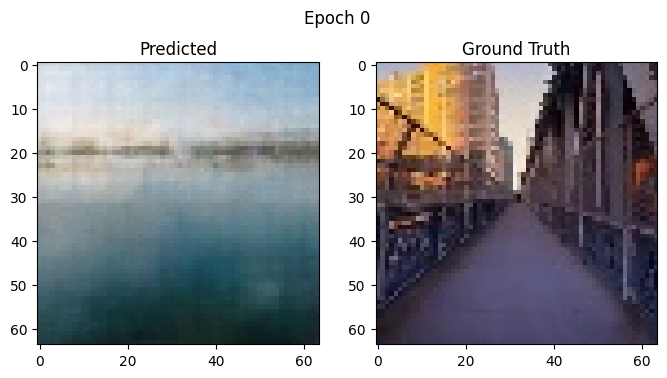

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 147.22it/s, v_num=77]    Validation loss: 17608.908203125


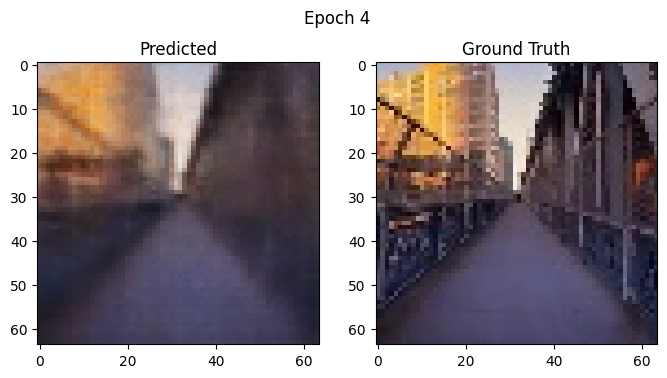

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 148.66it/s, v_num=77]Validation loss: 16125.541015625


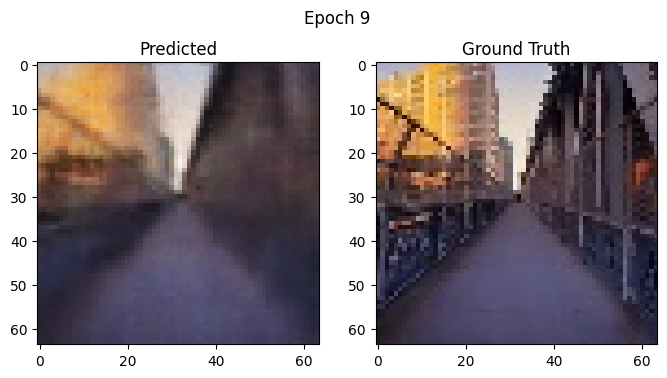

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 137.77it/s, v_num=77]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 137.76it/s, v_num=77]


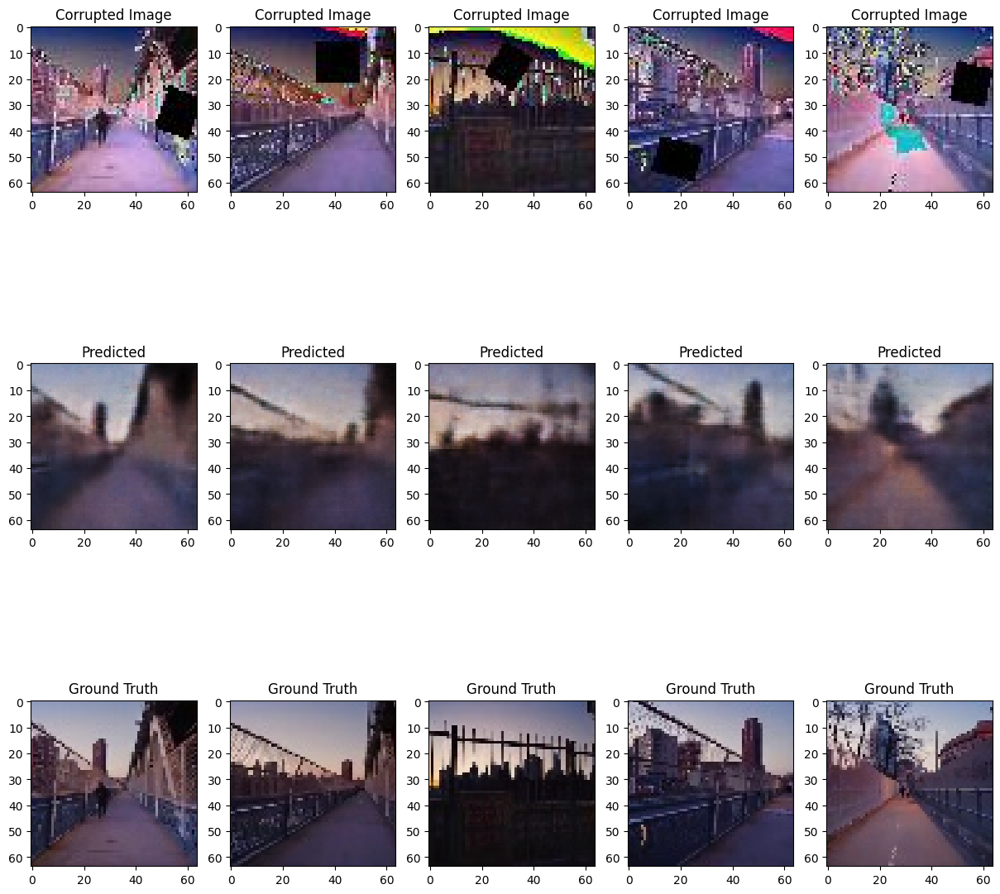

,MSE,NRMSE,PSNR,SSIM
max,0.037839,0.196838,31.576450,0.938268
mean,0.007043,0.084193,22.023543,0.642638
min,0.000556,0.026374,14.117838,0.232488


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-1 training with 5 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 102086.4921875


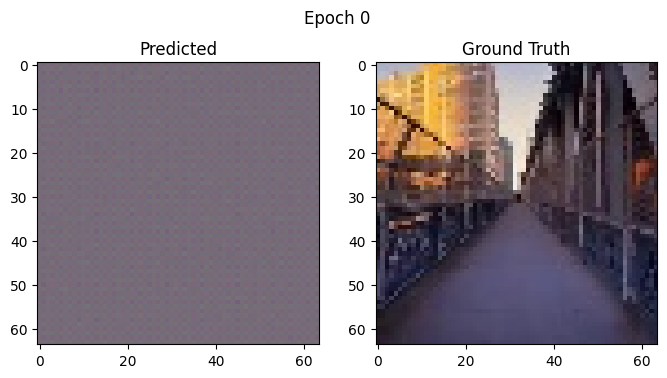

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 151.51it/s, v_num=78]    Validation loss: 20899.302734375


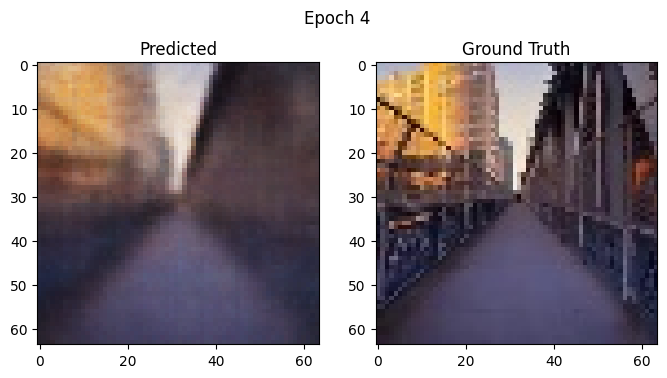

Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 140.78it/s, v_num=78]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 140.76it/s, v_num=78]
SimCLR training with 10 epochs and kl_lambda=0.6


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.47it/s, v_num=79, train/loss=2.300]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.46it/s, v_num=79, train/loss=2.300]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.


VAE-2 training with 10 epochs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 110834.78125


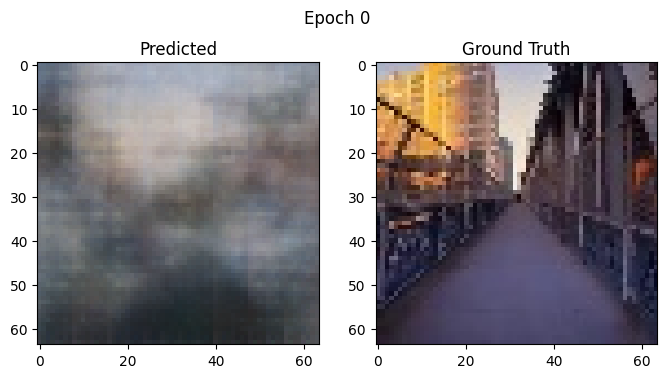

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 154.19it/s, v_num=80]    Validation loss: 17961.490234375


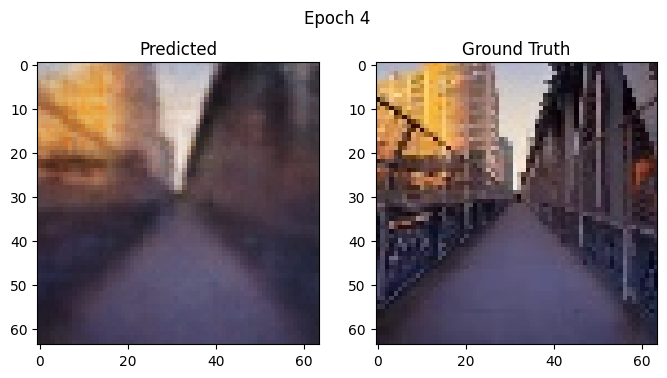

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 150.29it/s, v_num=80]Validation loss: 16298.76953125


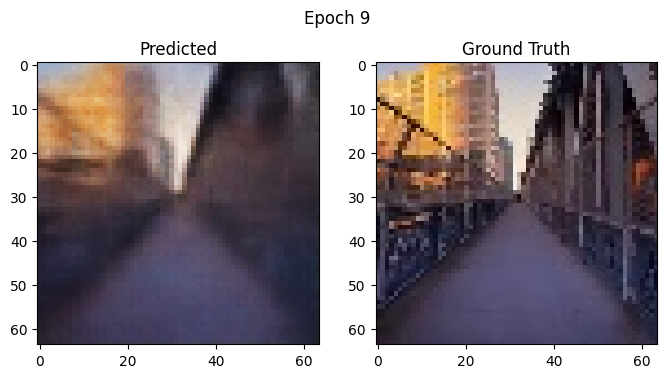

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 139.15it/s, v_num=80]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 139.14it/s, v_num=80]


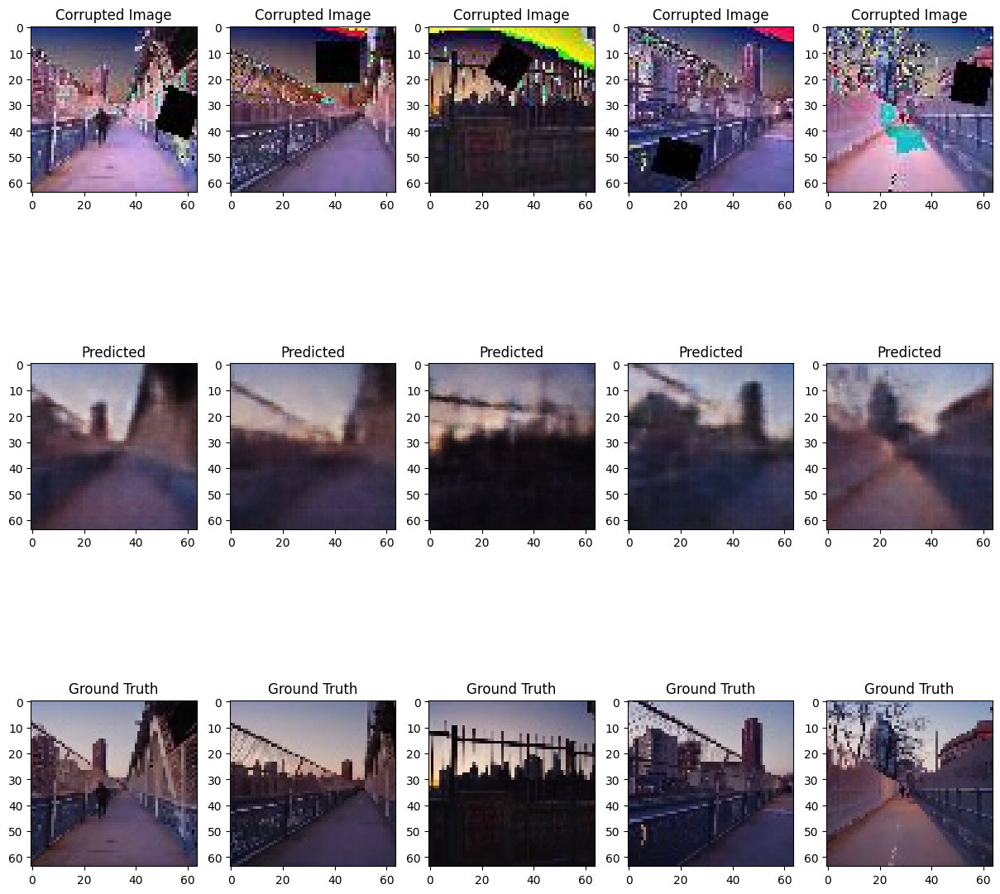

,MSE,NRMSE,PSNR,SSIM
max,0.038356,0.198179,31.331361,0.947809
mean,0.007050,0.084151,22.038982,0.642511
min,0.000588,0.027129,14.058838,0.241869


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-1 training with 5 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 132754.828125


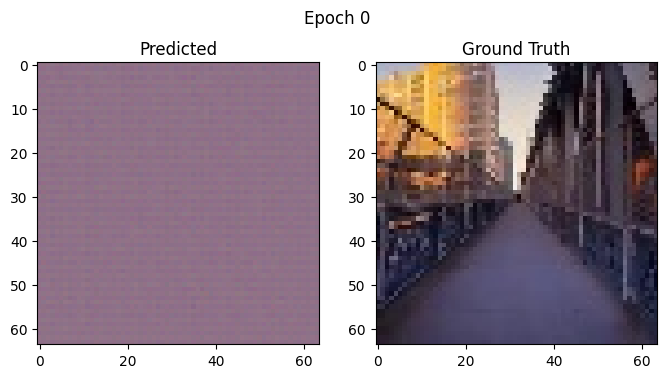

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 154.62it/s, v_num=81]    Validation loss: 20687.767578125


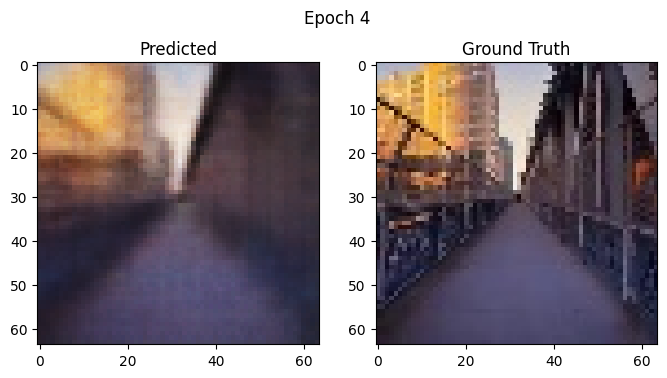

Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 142.73it/s, v_num=81]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 142.72it/s, v_num=81]
SimCLR training with 10 epochs and kl_lambda=0.9


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.58it/s, v_num=82, train/loss=1.300]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.58it/s, v_num=82, train/loss=1.300]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-2 training with 10 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 110510.734375


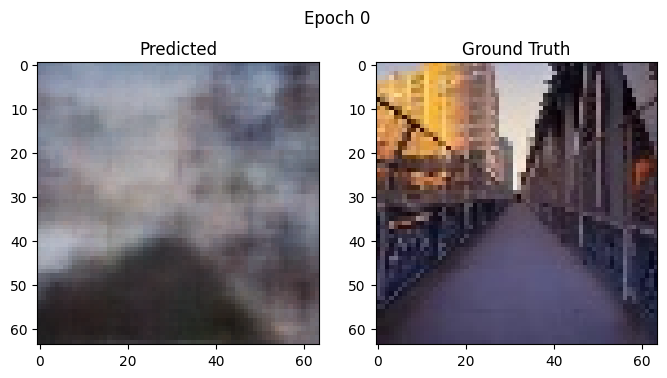

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 151.02it/s, v_num=83]    Validation loss: 17628.5390625


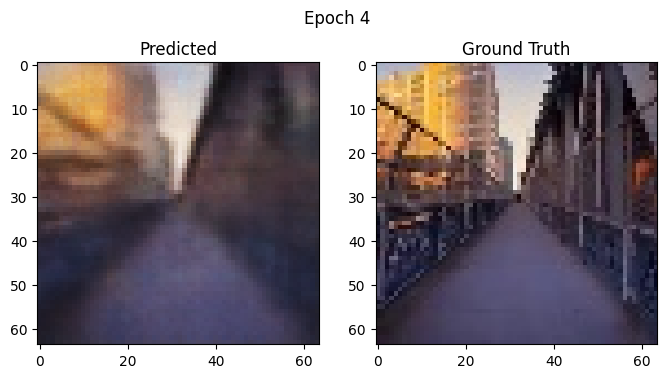

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 145.93it/s, v_num=83]Validation loss: 16203.14453125


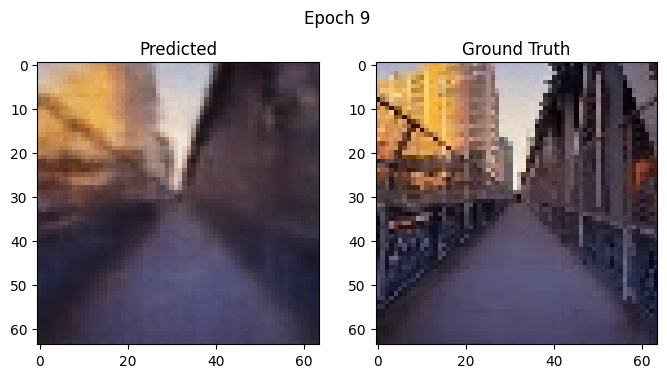

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 135.33it/s, v_num=83]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 135.32it/s, v_num=83]


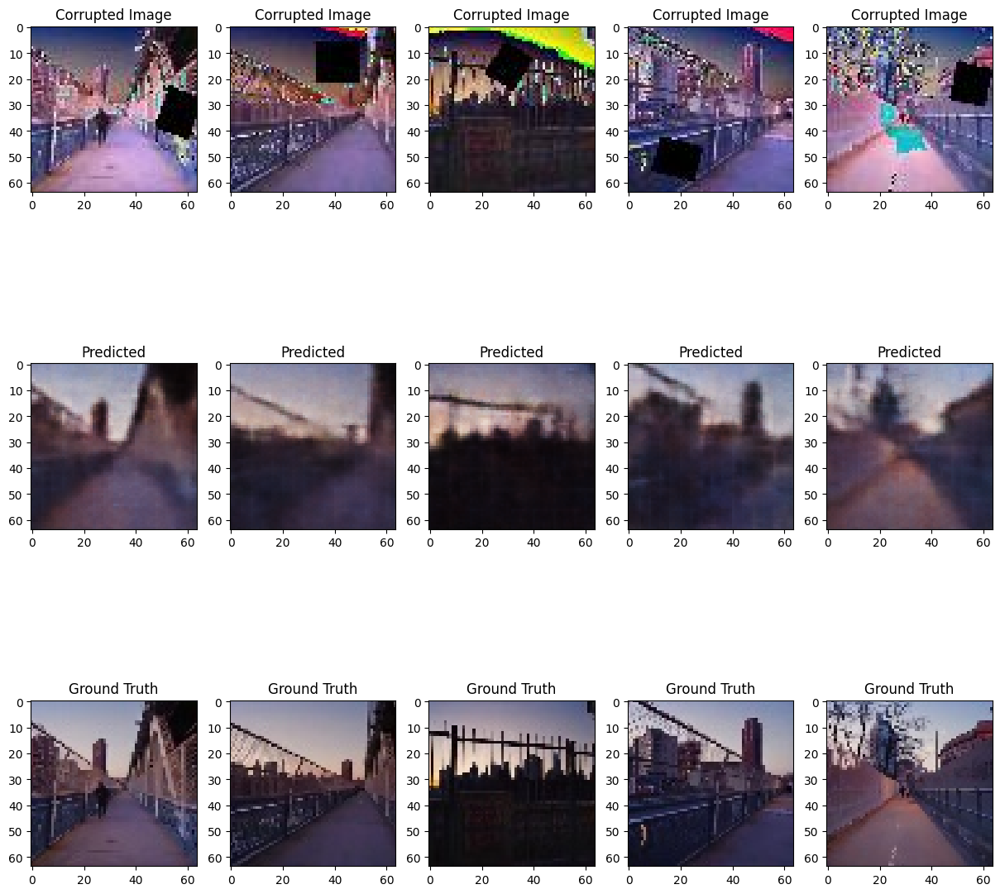

,MSE,NRMSE,PSNR,SSIM
max,0.035599,0.190923,30.255572,0.942476
mean,0.006970,0.083977,22.025700,0.642355
min,0.000767,0.030706,14.382821,0.261484


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-1 training with 5 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 117919.4296875


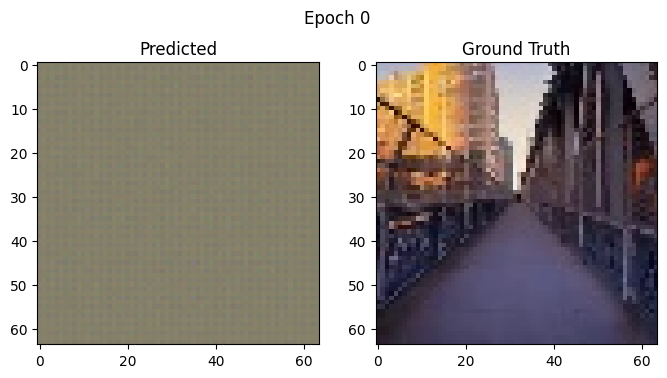

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 152.77it/s, v_num=84]    Validation loss: 20763.19140625


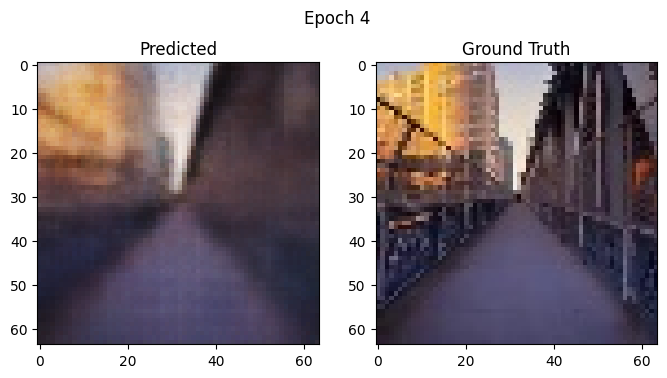

Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 141.46it/s, v_num=84]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1894/1894 [00:13<00:00, 141.44it/s, v_num=84]
SimCLR training with 10 epochs and kl_lambda=1


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | VAEEncoder | 2.2 M  | train
1 | projector | Sequential | 8.6 K  | train
2 | aug_1     | Sequential | 0      | train
3 | aug_2     | Sequential | 0      | train
-------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.930     Total estimated model params size (MB)


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.18it/s, v_num=85, train/loss=0.854]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:18<00:00, 101.17it/s, v_num=85, train/loss=0.854]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | VariationalAutoencoder | 4.4 M  | train
---------------------------------------------------------
4.4 M     Trainable params
0         Non-trainable params
4.4 M     Total params
17.757    Total estimated model params size (MB)


VAE-2 training with 10 epochs
Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]Validation loss: 103327.9140625


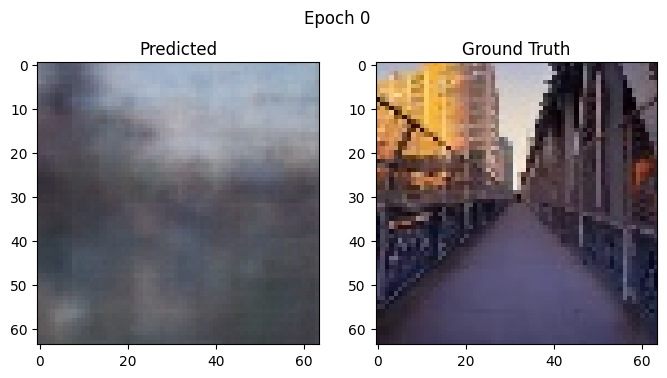

Epoch 4: 100%|██████████| 1894/1894 [00:12<00:00, 155.14it/s, v_num=86]    Validation loss: 17804.681640625


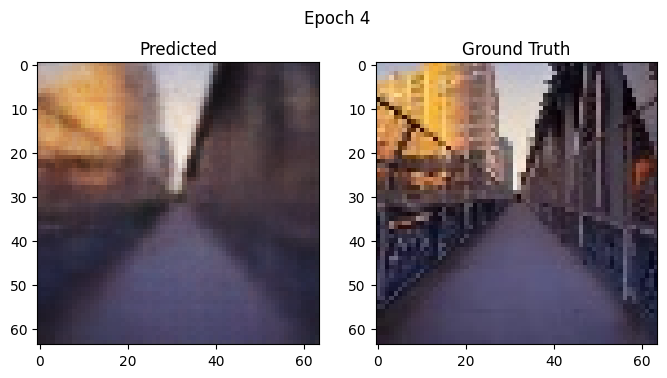

Epoch 9: 100%|██████████| 1894/1894 [00:12<00:00, 154.34it/s, v_num=86]Validation loss: 16054.23828125


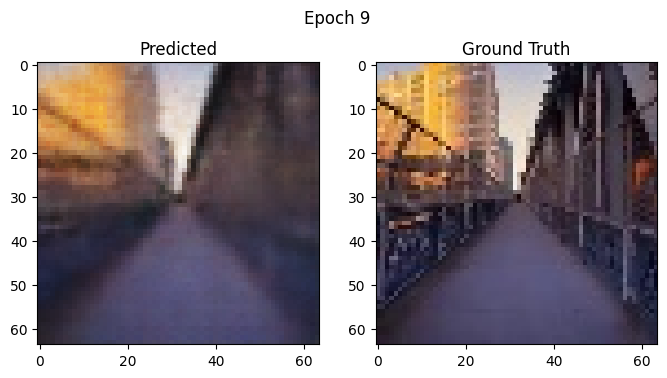

Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 142.49it/s, v_num=86]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 1894/1894 [00:13<00:00, 142.48it/s, v_num=86]


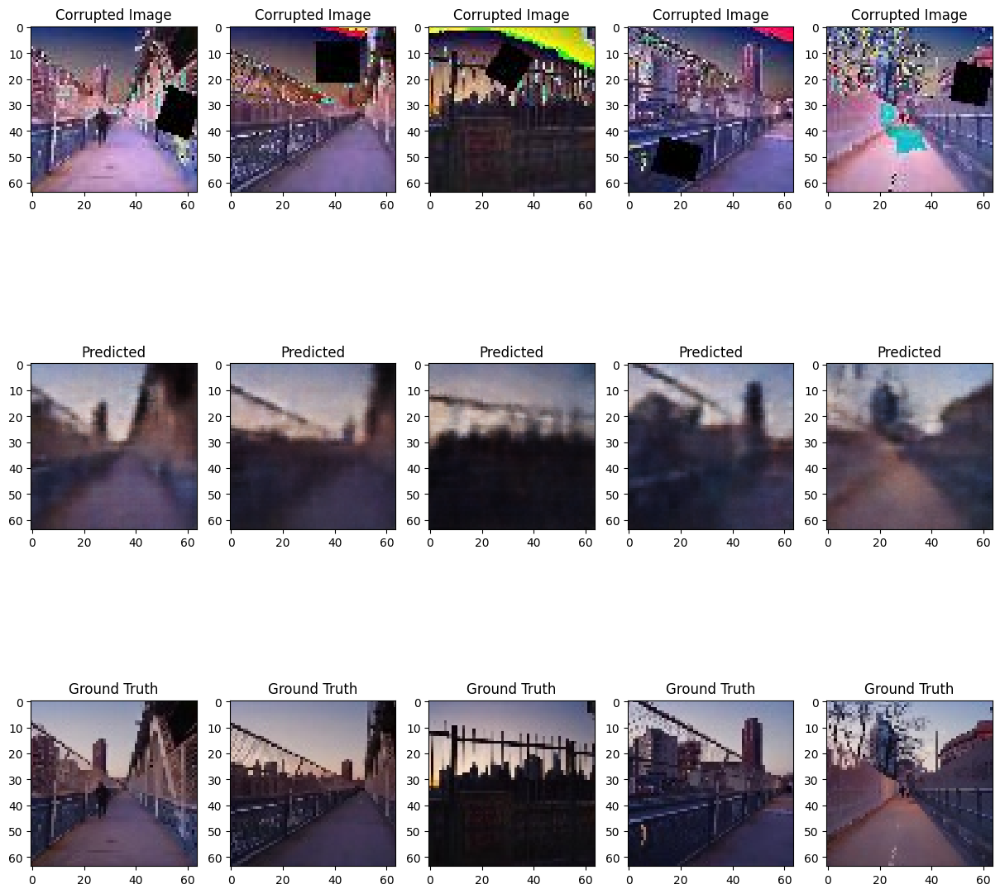

,MSE,NRMSE,PSNR,SSIM
max,0.038450,0.198421,31.208554,0.940761
mean,0.006915,0.083509,22.076110,0.642523
min,0.000605,0.027515,14.048262,0.242258


In [17]:
kl_lambdas = [0, 0.1, 0.3, 0.6, 0.9, 1]
kl_lambda_vcv_results = pd.DataFrame()

for kl_lambda in kl_lambdas:
    res = train_vcv(10, 15, kl_lambda, 64)
    kl_lambda_vcv_results = pd.concat([kl_lambda_vcv_results, res], ignore_index=True)

In [18]:
display(kl_lambda_vcv_results)

,MSE,NRMSE,PSNR,SSIM,kl_lambda
0,0.007003,0.083972,22.052820,0.642594,0.0
1,0.006926,0.083548,22.086165,0.644608,0.1
2,0.007043,0.084193,22.023543,0.642638,0.3
3,0.007050,0.084151,22.038982,0.642511,0.6
4,0.006970,0.083977,22.025700,0.642355,0.9
5,0.006915,0.083509,22.076110,0.642523,1.0


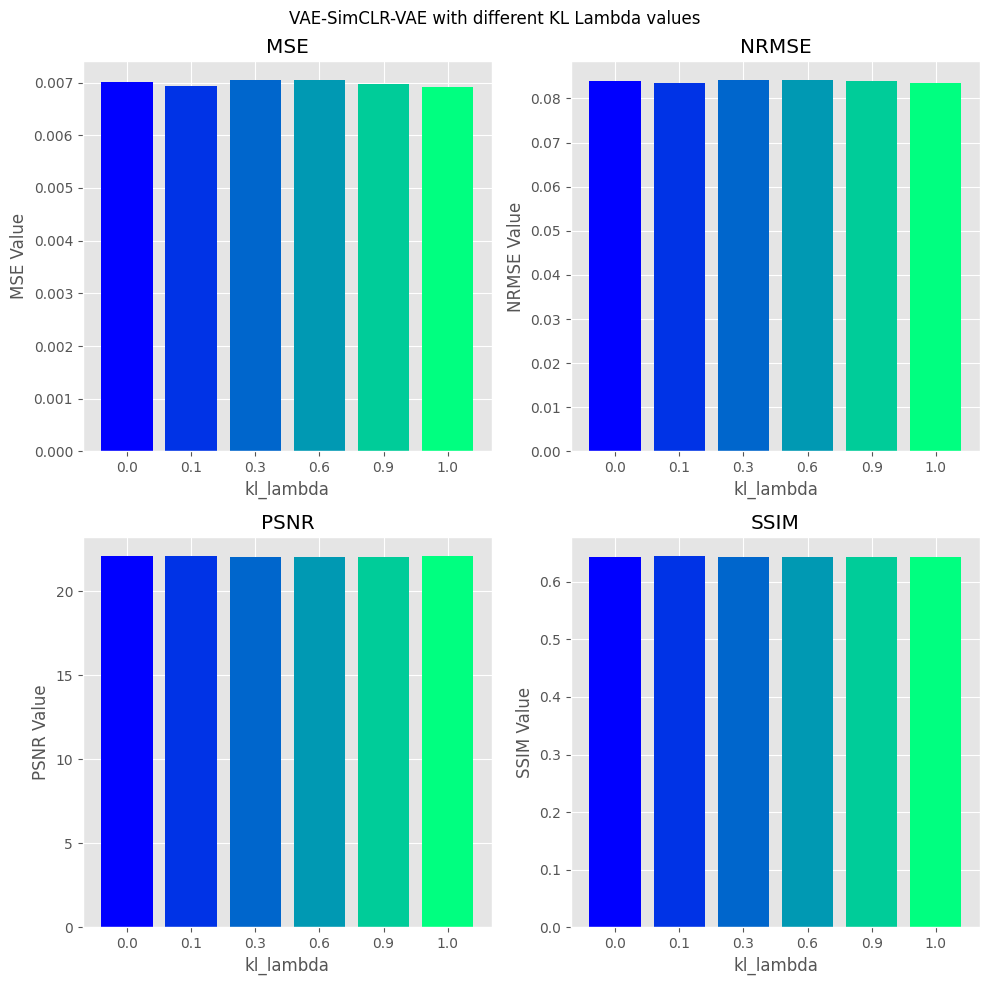

In [19]:
kl_lambda_vcv_results = kl_lambda_vcv_results.set_index('kl_lambda')
kl_lambda_vcv_results.index = kl_lambda_vcv_results.index.astype(str)

colors = cm.winter(np.linspace(0, 1, len(kl_lambda_vcv_results.index)))

plt.style.use('ggplot')

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].bar(kl_lambda_vcv_results.index, kl_lambda_vcv_results['MSE'], color=colors)
axs[0, 0].set_title('MSE')
axs[0, 0].set_xlabel('kl_lambda')
axs[0, 0].set_ylabel('MSE Value')

axs[0, 1].bar(kl_lambda_vcv_results.index, kl_lambda_vcv_results['NRMSE'], color=colors)
axs[0, 1].set_title('NRMSE')
axs[0, 1].set_xlabel('kl_lambda')
axs[0, 1].set_ylabel('NRMSE Value')

axs[1, 0].bar(kl_lambda_vcv_results.index, kl_lambda_vcv_results['PSNR'], color=colors)
axs[1, 0].set_title('PSNR')
axs[1, 0].set_xlabel('kl_lambda')
axs[1, 0].set_ylabel('PSNR Value')

axs[1, 1].bar(kl_lambda_vcv_results.index, kl_lambda_vcv_results['SSIM'], color=colors)
axs[1, 1].set_title('SSIM')
axs[1, 1].set_xlabel('kl_lambda')
axs[1, 1].set_ylabel('SSIM Value')

plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.suptitle('VAE-SimCLR-VAE with different KL Lambda values')
plt.tight_layout()
plt.show()

## Results and Conclusions


### Wstęp

W celu zbadania postawionej hipotezy sprawdzone zostały dwa podejścia: `SimCLR-VAE` oraz `VAE-SimCLR-VAE`. Pierwsza z nich polegała na wyuczeniu *enkodera* za pomocą metody `SimCLR` przez 15 epok, a następnie wyuczeniu całego modelu `VAE` przez 30 epok. Druga metoda polegała na uwarunkowaniu enkoder na zadaniu inpaintingu z wykorzystaniem modelu `VAE` przez 10 epok, następnie douczeniu jego reprezentacji za pomocą metody `SimCLR` i ostatecznie douczeniu całego modelu `VAE` przez kolejne 20 epok. Dla porównania wyuczono także podstawowe `VAE` przez 30 epok, jako punkt odniesienia.


### Wynik hipotezy badawczej

**Hipoteza:** Zastosowanie metody `Simple Framework for Contrastive Learning of Visual Representations (SimCLR)` do treningu enkodera modelu `Variational Autoencoder (VAE)` doprowadzi do poprawy jego wydajności w zadaniu inpaintingu obrazów.

Jak wynika z badań, można jednoznacznie stwierdzić, że metoda `SimCLR` nie poprawia wyników modleu `VAE` dla zadaniu inpainingu, a nawet wręcz potrafi je pogorszyć. Z wyników wynika, że podstawowy model `VAE` osiąga lepsze rezultaty od jego modyfikacji.

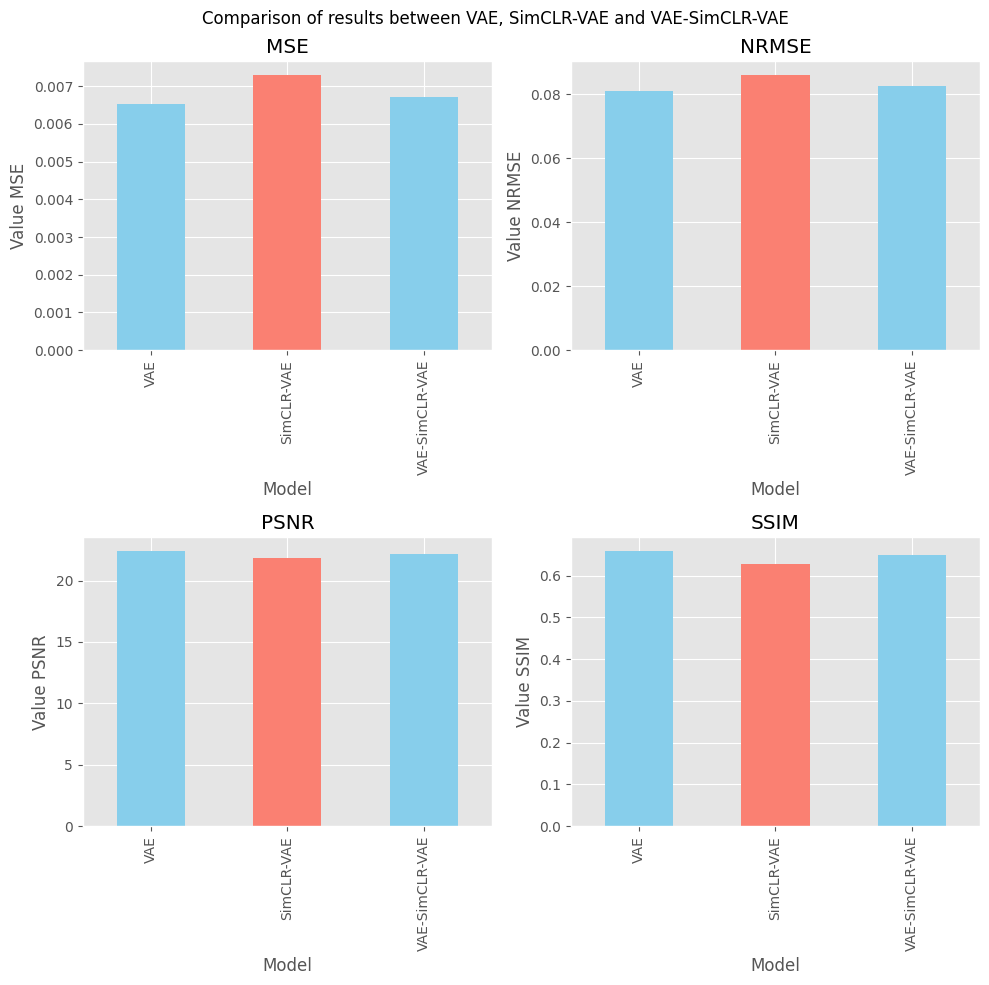



### Wyniki Eksperymentu

W zadaniu przebadany został wpływ hiperparametru `lambda_kl` na efektywność uczenia się metody `SimCLR`. Oba z proponoponowanych podejść `SimCLR-VAE` oraz `VAE-SimCLR-VAE` uczone były dla 6 wartości parametru {0, 0.1, 0.3, 0.6, 0.9, 1}. Proces uczenia trwał 15 epok modelu `VAE` (w drugiej konfiguracji w stosunku 1:2) oraz 10 epok modelu `SimCLR`.

Na podstawie wyników badania można stwierdzić, że parametr `lambda_kl` nie posiada tak dużego wpływu na wyniki jak zakładano początkowo. Dla podejścia `SimCLR-VAE` najlepsze okazały się wartości parametrów 0.1 oraz 0.6, jednakże poprawa była minimalnie lepsza od pozostałych. DLa podejścia `VAE-SimCLR-VAE` wartości parametru `lambda_kl` nie przyniosły widocznej poprawy. Można jednak odczytać z wykresu, że minimalnie lepsze wyniki odniósł model dla wartości `lambda_kl` równej 0.6


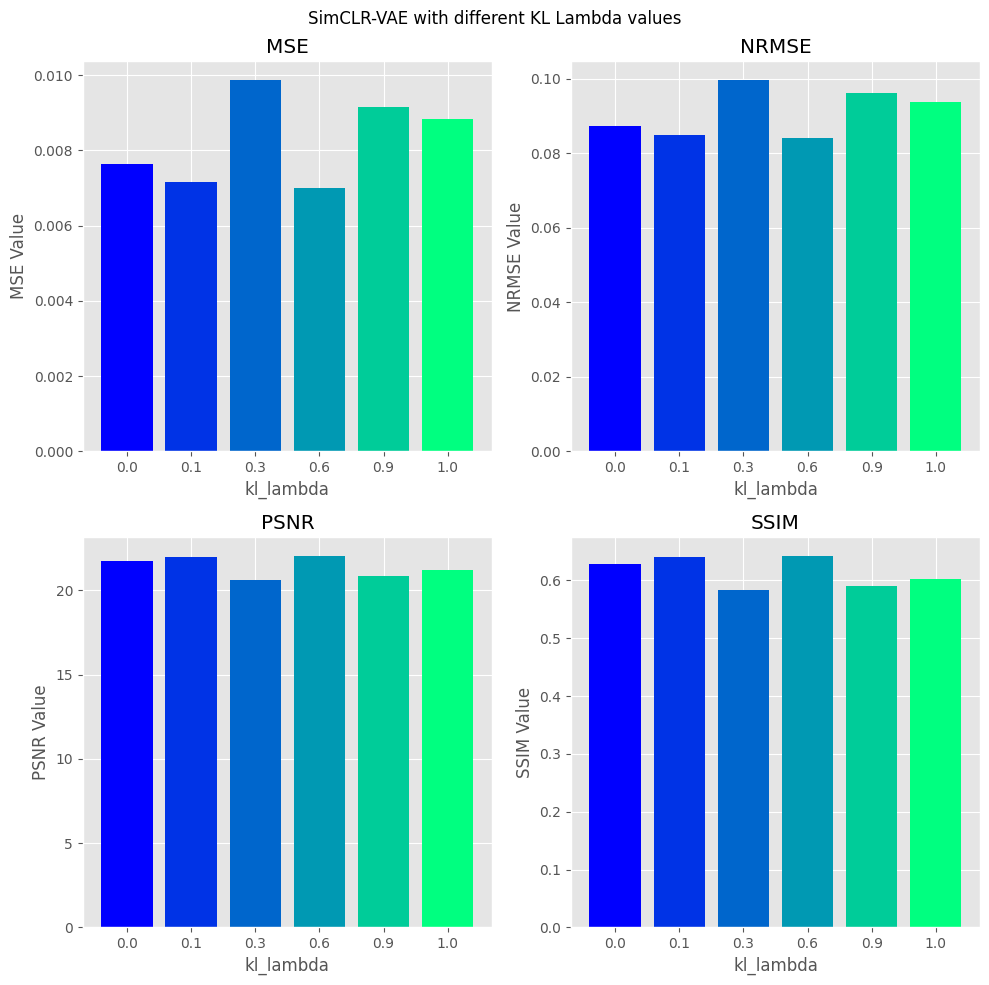

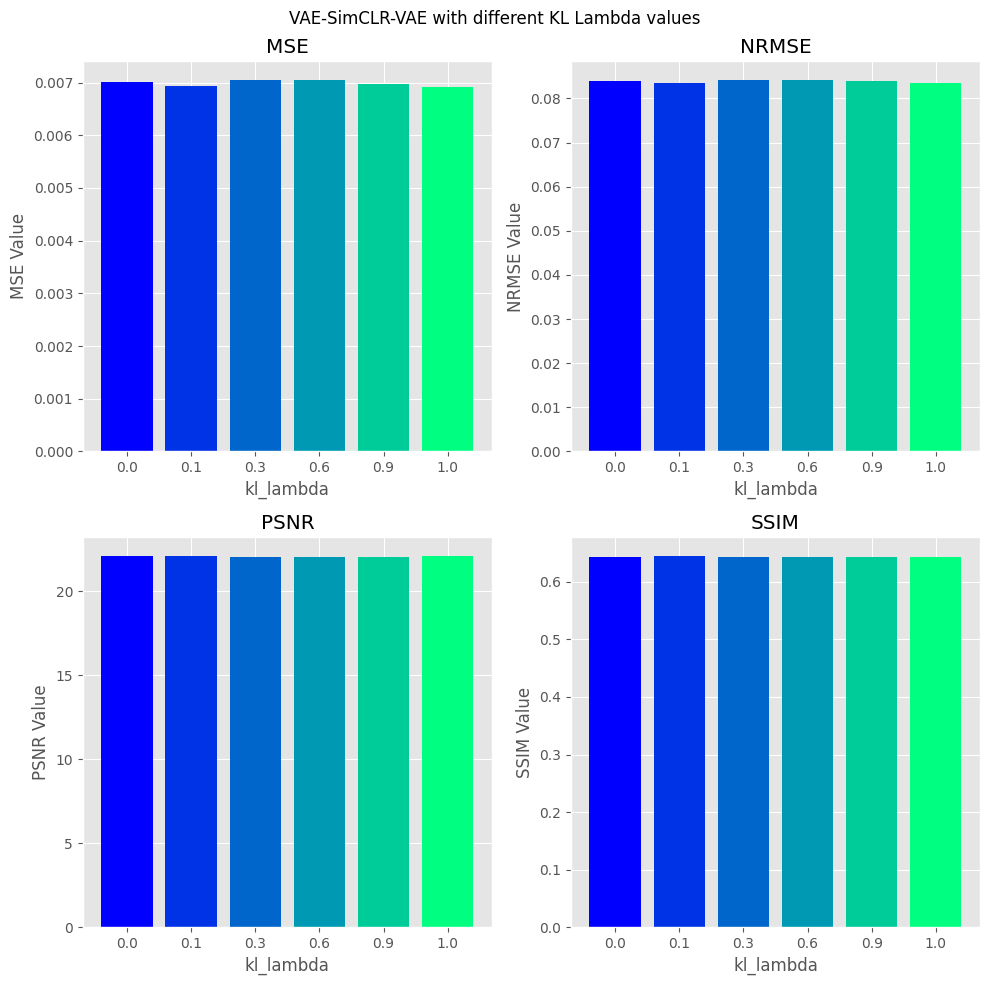

S